# **CRIMINALIDAD Y RENTA MEDIA EN ESPAÑA ENTRE 2019 Y 2021**
## GEOSPATIAL DATA SCIENCE - BIG DATA GEOESPACIAL - TIG
### Marcos Díaz y Marco Fossoul

In [1]:
# liberías habituales
%matplotlib inline
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
import scipy as scipy
from scipy import stats

# librerías especializadas en análisis geoespacial
import pysal as ps
import geopandas as gpd
import cartopy
import cartopy.crs as ccrs
import skgstat as skg
import seaborn as sns
import mapclassify  #si devuelve un error, ejecute "conda install -c conda-forge mapclassify" o "pip install mapclassify"

# ignorar warnings
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning
import warnings
warnings.simplefilter('ignore', category=NumbaDeprecationWarning)
warnings.simplefilter('ignore', category=FutureWarning) 

In [2]:
# Cargamos los datos
dfc = pd.read_csv('crime_rate_Spain.csv')

In [3]:
# Visualizamos las primeras 5 filas
dfc.head()

,Location,Year,Crime,Total cases
0,Barcelona,2021,Intentional homicides and consummated murders,36
1,Barcelona,2021,Intentional homicides and attempted murders,137
2,Barcelona,2021,Serious and less serious crimes of injuries an...,2161
3,Barcelona,2021,Kidnapping,8
4,Barcelona,2021,Crimes against freedom and sexual indemnity,2406


In [4]:
# Comprobamos el tamaño del dataset - (filas, columnas)
dfc.shape

(672, 4)

In [5]:
# Comprobamos los datatypes con info()
dfc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 672 entries, 0 to 671
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Location     672 non-null    object
 1   Year         672 non-null    int64 
 2   Crime        672 non-null    object
 3   Total cases  672 non-null    int64 
dtypes: int64(2), object(2)
memory usage: 21.1+ KB


In [6]:
# No hay valores nulos
dfc.isnull().sum()

Location       0
Year           0
Crime          0
Total cases    0
dtype: int64

In [7]:
# Filtrar el DataFrame para excluir las filas con 'Spain' en la columna 'Location'
dfc = dfc[dfc['Location'] != 'Spain']

# Cambiamos Seville por Sevilla
nombre_antiguo = "Seville"
nombre_nuevo = "Sevilla"
dfc['Location'] = dfc['Location'].replace(nombre_antiguo, nombre_nuevo)

# Aseguramos de que el índice se reajuste si es necesario
dfc = dfc.reset_index(drop=True)
dfc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 630 entries, 0 to 629
Data columns (total 4 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Location     630 non-null    object
 1   Year         630 non-null    int64 
 2   Crime        630 non-null    object
 3   Total cases  630 non-null    int64 
dtypes: int64(2), object(2)
memory usage: 19.8+ KB


## Análisis básico de los datos

### ¿En qué provincia ocurren más crímenes?

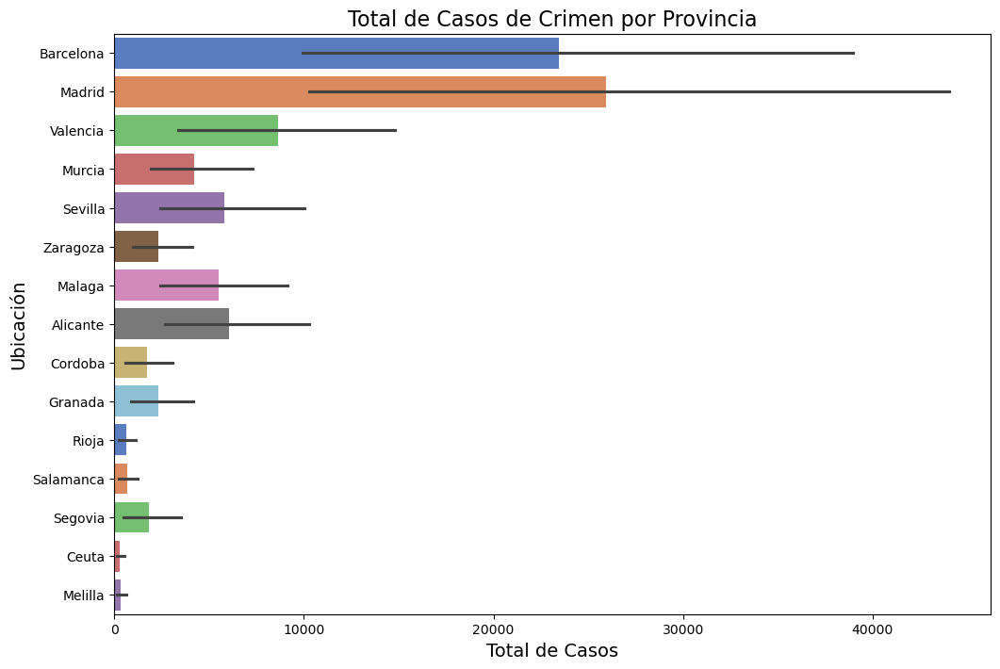

In [8]:
# Crear el gráfico de barras
plt.figure(figsize=(12, 8))
sns.barplot(data=dfc, y='Location', x='Total cases', palette='muted')

# Añadir título y etiquetas de los ejes
plt.title('Total de Casos de Crimen por Provincia', fontsize=16)
plt.xlabel('Total de Casos', fontsize=14)
plt.ylabel('Ubicación', fontsize=14)

# Mostrar el gráfico
plt.show()

Visualizamos la relación entre las provincias (Location) y los casos totales de crimen (Total cases) en este gráfico de barras

### ¿Cuáles son los crímenes más recurrentes? Clasificación por tipo de crimen

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


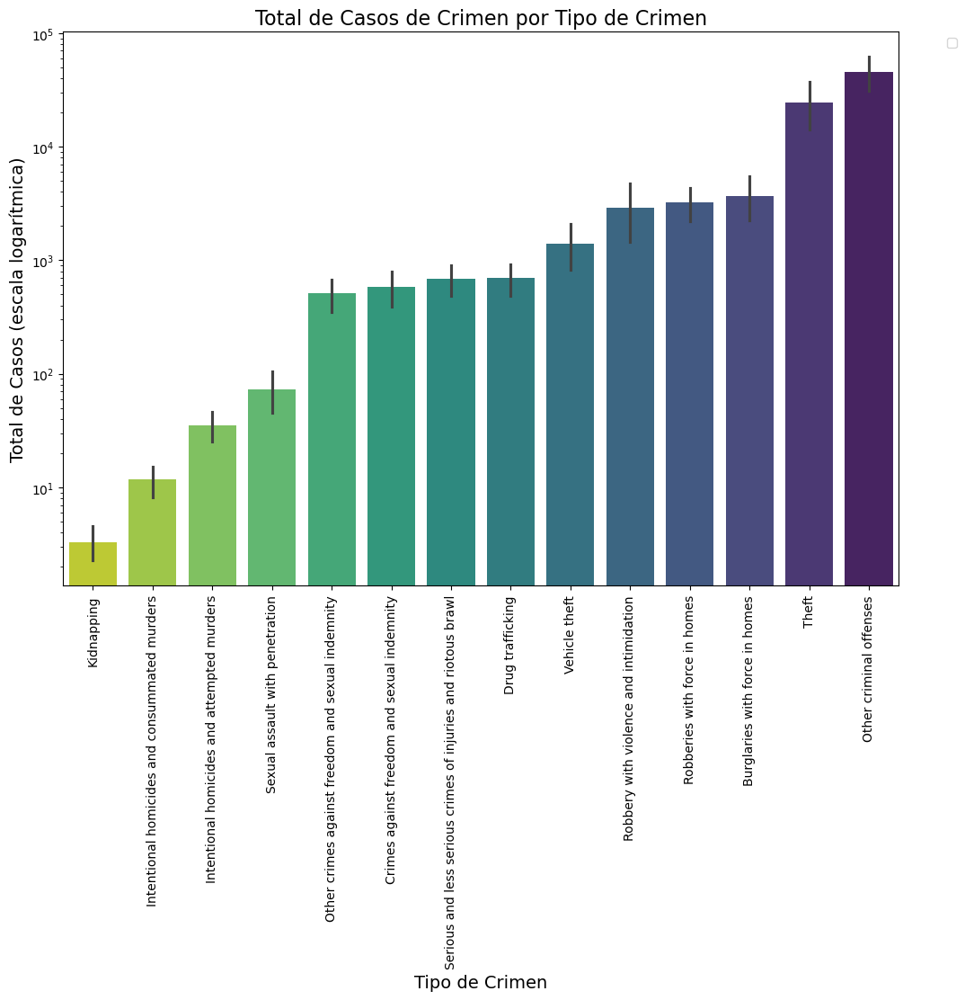

In [9]:
#Obtenemos el orden de las categorías en el eje x (ordenadas por el total de casos)
order = dfc.groupby('Crime')['Total cases'].sum().sort_values().index

# Creamos el gráfico de barras con escala logarítmica en el eje y
plt.figure(figsize=(12, 8))
sns.barplot(data=dfc, x='Crime', y='Total cases', palette='viridis_r', order=order)

# Ajustamos límites del eje y para evitar valores negativos grandes
plt.yscale('log')

# Añadimos título y etiquetas de los ejes
plt.title('Total de Casos de Crimen por Tipo de Crimen', fontsize=16)
plt.xlabel('Tipo de Crimen', fontsize=14)
plt.ylabel('Total de Casos (escala logarítmica)', fontsize=14)

# Rotamos las etiquetas del eje x para mejorar la legibilidad
plt.xticks(rotation=90)

# Ajustamos la leyenda fuera del gráfico
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

# Mostramos el gráfico
plt.show()

### Tabla Compuesta en relación a los tipos de crimen

In [10]:
df1 = dfc[dfc['Total cases'] != 0]
no_crime_df = pd.DataFrame(df1.groupby(['Crime', 'Location', 'Year'])['Total cases'].max())
no_crime_df

Total cases
Crime                          Location  Year             
Burglaries with force in homes Alicante  2019         9346
                                         2020          620
                                         2021         6672
                               Barcelona 2019        23986
                                         2020         4061
...                                                    ...
Vehicle theft                  Valencia  2020         1257
                                         2021         1338
                               Zaragoza  2019          220
                                         2020          158
                                         2021          199

[612 rows x 1 columns]

### ¿En qué Año ocurren más crímenes?

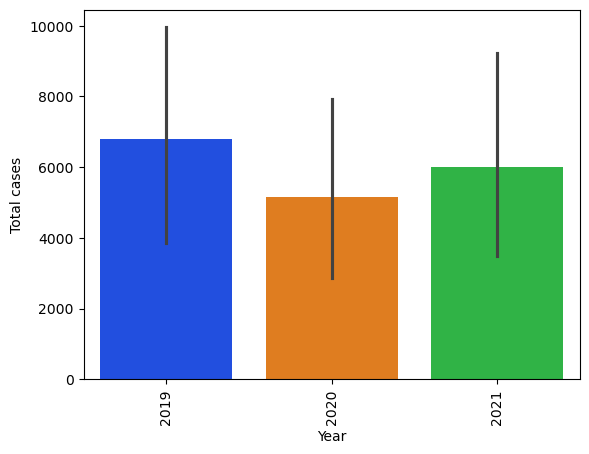

In [11]:

sns.barplot(data=dfc, x='Year', y='Total cases', palette='bright')
plt.xticks(rotation=90)
plt.show()

Es de esperar que la primera mitad del 2020, durante la crisis del COVIS-19, haya contribuido en la bajada de criminalidad en el resto del año. Por otro lado, los el índice en 2021 se mantiene más bajo que en 2019.

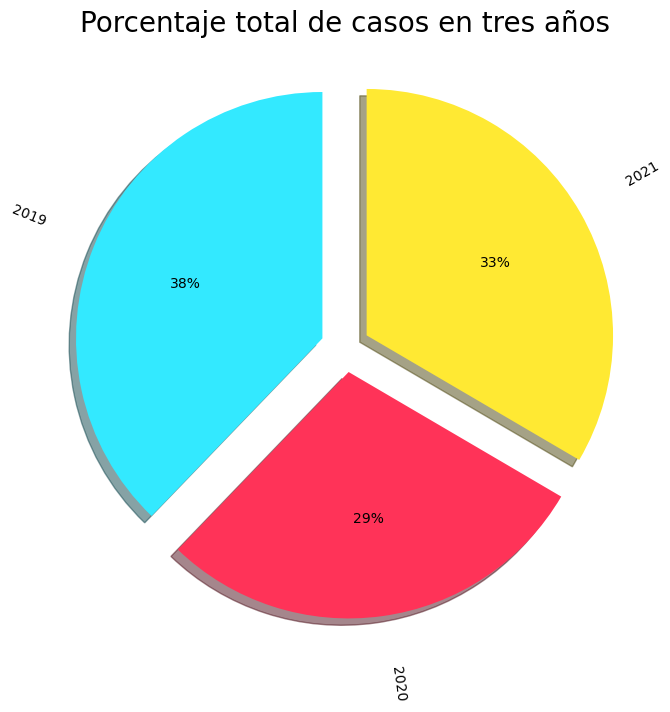

In [12]:
X=dfc[dfc['Year']==2019]['Total cases'].sum()
X_1=dfc[dfc['Year']==2020]['Total cases'].sum()
X_2=dfc[dfc['Year']==2021]['Total cases'].sum()
z=[X,X_1,X_2]
ex=[0.1,0.1,0.1]
Lab=[2019,2020,2021]
col=['#33E9FF','#FF3358','#FFE933']
plt.figure(figsize=(25,8))
plt.title('Porcentaje total de casos en tres años',fontsize=20)
plt.pie(z,labels=Lab,shadow=True,
        startangle=90,
        explode=ex,
        autopct='%1.0F%%',
        rotatelabels=True,
        colors=col,
        labeldistance=1.2)
plt.show( )

### Gráfico de tártas - % de Casos Totales por año

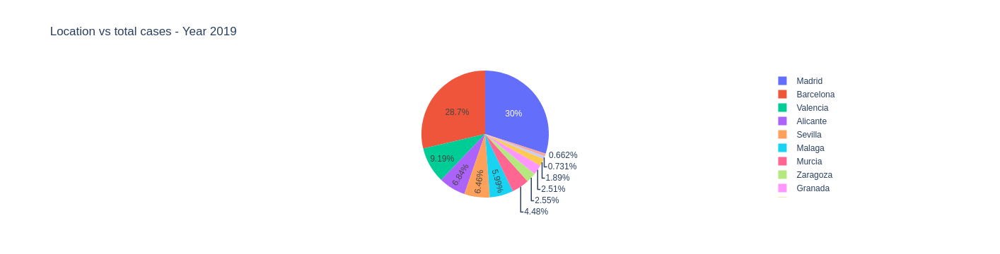

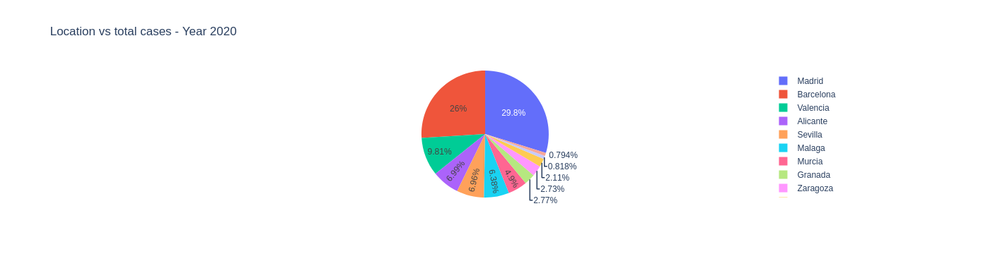

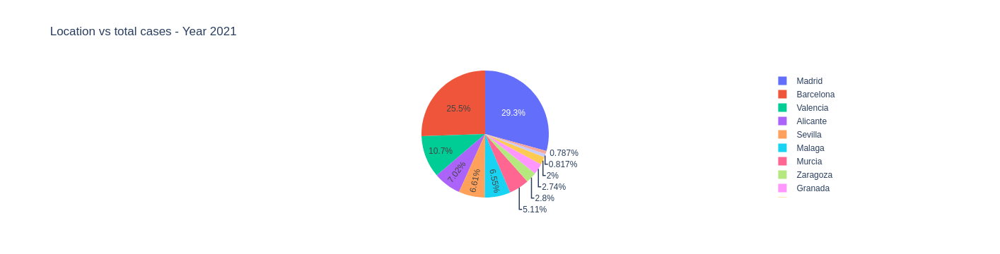

In [13]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots

# Agrupar por 'Location' y 'Year' y sumar los casos
temp = pd.DataFrame(dfc.groupby(['Location', 'Year'])['Total cases'].sum()).reset_index()

# Ordenar por 'Total cases' en orden descendente
temp = temp.sort_values(['Year', 'Total cases'], ascending=[True, False])

# Obtener las ubicaciones principales (puedes ajustar este número según tus necesidades)
top_locations = temp['Location'].unique()[:12]

# Crear un gráfico separado por cada año
for year in temp['Year'].unique():
    temp_year = temp[temp['Year'] == year]
    temp_year = temp_year[temp_year['Location'].isin(top_locations)]
    
    labels = temp_year['Location']
    values = temp_year['Total cases']
    
    fig = go.Figure(data=[go.Pie(labels=labels, values=values)])
    fig.update_layout(title_text=f'Location vs total cases - Year {year}')
    fig.show()

Podemos interpretar que en 2020 y 2021, las ciudades de Barcelona y Madrid han reducido su índice de criminalidad. Sin embargo, en Valencia y Alicante, por ejemplo, han ido en aumento desde 2019.

### ¿Cuál ha sido la mínima y la máxima cantidad de casos por crimen entre 2019 y 2021?

In [14]:
# we can revisualize the Crimes and their min and max values
pd.DataFrame(dfc.groupby(['Crime']).agg({'Total cases': ['min', 'max']}))

Total cases        
                                                           min     max
Crime                                                                 
Burglaries with force in homes                              56   23986
Crimes against freedom and sexual indemnity                 23    2420
Drug trafficking                                            43    2833
Intentional homicides and attempted murders                  2     142
Intentional homicides and consummated murders                0      45
Kidnapping                                                   0      16
Other crimes against freedom and sexual indemnity           22    2146
Other criminal offenses                                   2558  205312
Robberies with force in homes                               31   16180
Robbery with violence and intimidation                      24   23836
Serious and less serious crimes of injuries and...          37    2717
Sexual assault with penetration                              1     436
Theft                                                      434  165901
Vehicle theft                                               20    8392

### Otra forma de representación

In [15]:
print(dfc.groupby(['Location','Year'])['Total cases'].sum())

Location   Year
Alicante   2019     96523
           2020     72732
           2021     85378
Barcelona  2019    404552
           2020    270214
           2021    310469
Ceuta      2019      4854
           2020      3712
           2021      4004
Cordoba    2019     26617
           2020     21938
           2021     24290
Granada    2019     35446
           2020     28840
           2021     33274
Madrid     2019    423399
           2020    310194
           2021    356531
Malaga     2019     84583
           2020     66451
           2021     79712
Melilla    2019      5716
           2020      4545
           2021      4208
Murcia     2019     63248
           2020     50969
           2021     62206
Rioja      2019      9341
           2020      8268
           2021      9573
Salamanca  2019     10320
           2020      8520
           2021      9943
Segovia    2019      4700
           2020     35489
           2021     36521
Sevilla    2019     91186
           2020     72

### ¿Cuáles han sido las provincias con mayores casos de criminalidad y cuál ha sido su año más violento?

[2019 2020 2021]


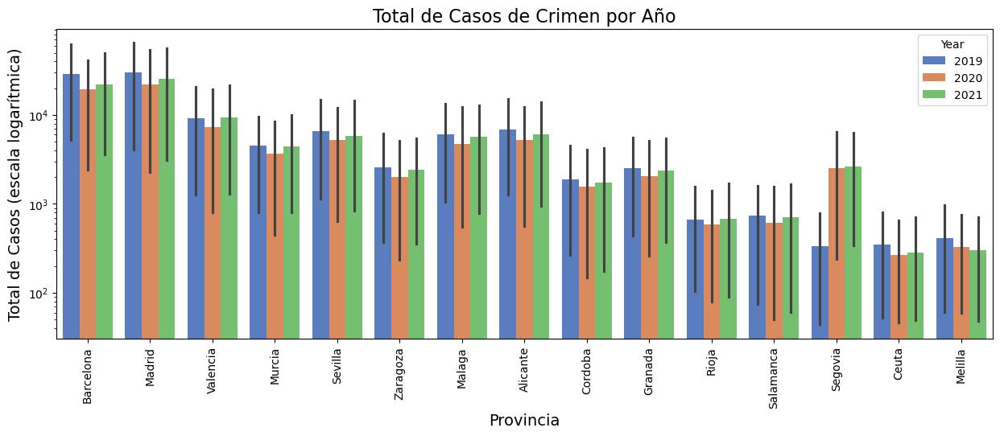

In [16]:
# Import label encoder
from sklearn import preprocessing
  
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()

plt.figure(figsize=(15,5))
sns.barplot(data=dfc, x='Location', y='Total cases', hue='Year', palette='muted')

# Ajustar límites del eje y para evitar valores negativos grandes
plt.yscale('log')

# Añadir título y etiquetas de los ejes
plt.title('Total de Casos de Crimen por Año', fontsize=16)
plt.xlabel('Provincia', fontsize=14)
plt.ylabel('Total de Casos (escala logarítmica)', fontsize=14)

# Rotar las etiquetas del eje x para mejorar la legibilidad
plt.xticks(rotation=90)

print(np.unique(dfc[['Year']].values))

Curioso el caso de Segovia. Según el peródico "Segoviaudaz": "(2019) El índice de infracciones penales por mil habitantes se sitúa en la provincia en el 27,1 por mil, casi diez puntos por debajo de la media nacional". Sin embargo, durante 2020 aumentaron los casos de criminalidad. Segun la Cope: "En 2020, aumentaron de tres a ocho los homicidios dolosos y asesinatos consumados o en grado de tentativa"

## Preparación de los datos geográficos para su posterior representación en un mapa

In [17]:
from geopy.geocoders import Nominatim 

#Inicializamos Nominatim API (biblioteca geopy)
geolocator = Nominatim(user_agent="MyApp") 

#Almacenamos la información grográfica
dfc['latitude'] = '' 
dfc['longitude'] = '' 

#Aquí se buscan las coordenadas y se asignan
list1 = [] 
locationList = [] 
idx = 0 
dfc['latitude'] = '' 
latitudeDict = {} 
longitudeDict = {} 
mapList = pd.DataFrame(columns=['longitude', 'latitude', 'totalcases']) 
for i in dfc['Location'].unique(): 
    location = geolocator.geocode(i + ',Spain') 
    latitudeDict[i] = location.latitude 
    longitudeDict[i] = location.longitude 
    dfc['latitude'] = dfc['Location'].map(latitudeDict) 
    dfc['longitude'] = dfc['Location'].map(longitudeDict) 
dfc 

,Location,Year,Crime,Total cases,latitude,longitude
0,Barcelona,2021,Intentional homicides and consummated murders,36,41.382894,2.177432
1,Barcelona,2021,Intentional homicides and attempted murders,137,41.382894,2.177432
2,Barcelona,2021,Serious and less serious crimes of injuries an...,2161,41.382894,2.177432
3,Barcelona,2021,Kidnapping,8,41.382894,2.177432
4,Barcelona,2021,Crimes against freedom and sexual indemnity,2406,41.382894,2.177432
...,...,...,...,...,...,...
625,Melilla,2021,Robberies with force in homes,55,35.291870,-2.940903
626,Melilla,2021,Theft,576,35.291870,-2.940903
627,Melilla,2021,Vehicle theft,35,35.291870,-2.940903
628,Melilla,2021,Drug trafficking,230,35.291870,-2.940903


### Creamos dataFrame y agrupamos

In [18]:
mapdfc = pd.DataFrame(dfc.groupby(['Location', 'latitude', 'longitude'])['Total cases'].sum()) 
mapdfc.reset_index(inplace=True) 
mapdfc 

,Location,latitude,longitude,Total cases
0,Alicante,38.343637,-0.488171,254633
1,Barcelona,41.382894,2.177432,985235
2,Ceuta,35.894422,-5.355817,12570
3,Cordoba,37.884581,-4.776014,72845
4,Granada,37.173499,-3.599534,97560
5,Madrid,40.416705,-3.703582,1090124
6,Malaga,36.721303,-4.421637,230746
7,Melilla,35.291870,-2.940903,14469
8,Murcia,37.992379,-1.130543,176423
9,Rioja,42.328553,-2.467492,27182


In [19]:
#Guardamos el dataframe como csv
mapdfc.to_csv('crime.csv', index=False)

## JOIN de los datos de criminalidad con el Shapefile de Provincias ETRS89

In [20]:
## JOIN DE CRIME CON SHP PROVINCIAS
crime = gpd.read_file(r'crime_merge.csv')
crime = crime.drop(columns=['geometry']) 

shp = gpd.read_file(r'ProvinciasETRS8930N.shp')
shp.head()

,IDPROV,Texto,Texto_Alt,Cod_CCAA,CCAA,geometry
0,01,Álava,Araba,16,País Vasco,"POLYGON ((497823.750 4784874.150, 498456.775 4..."
1,02,Albacete,Albacete,08,Castilla - La Mancha,"POLYGON ((630529.311 4364287.687, 630118.311 4..."
2,03,Alicante,Alacant,10,Comunitat Valenciana,"MULTIPOLYGON (((720290.776 4227118.177, 720292..."
3,04,Almería,Almería,01,Andalucía,"MULTIPOLYGON (((572241.564 4064120.709, 572219..."
4,05,Ávila,Ávila,07,Castilla y León,"POLYGON ((331047.917 4558945.287, 331286.923 4..."


In [21]:
crime.head()

,Cod,Location,latitude,longitude,Total cases
0,03,Alicante,38.3436365,-0.4881708,254633
1,08,Barcelona,41.3828939,2.1774322,985235
2,51,Ceuta,35.89442195,-5.355817352394269,12570
3,14,Cordoba,37.8845813,-4.7760138,72845
4,18,Granada,37.1734995,-3.5995337,97560


### Creamos un GeoDataFrame

In [22]:
crime_shp = gpd.GeoDataFrame(shp.merge(crime, left_on='IDPROV', right_on='Cod'))
crime_shp

,IDPROV,Texto,Texto_Alt,Cod_CCAA,CCAA,geometry,Cod,Location,latitude,longitude,Total cases
0,03,Alicante,Alacant,10,Comunitat Valenciana,"MULTIPOLYGON (((720290.776 4227118.177, 720292...",03,Alicante,38.3436365,-0.4881708,254633
1,08,Barcelona,Barcelona,09,Cataluña,"MULTIPOLYGON (((885039.022 4672988.012, 885646...",08,Barcelona,41.3828939,2.1774322,985235
2,14,Córdoba,Córdoba,01,Andalucía,"MULTIPOLYGON (((316397.659 4168637.693, 318800...",14,Cordoba,37.8845813,-4.7760138,72845
3,18,Granada,Granada,01,Andalucía,"MULTIPOLYGON (((465193.305 4062565.436, 465158...",18,Granada,37.1734995,-3.5995337,97560
4,26,La Rioja,La Rioja,17,"Rioja, La","POLYGON ((500227.096 4721076.266, 500824.099 4...",26,Rioja,42.3285528,-2.4674917,27182
5,28,Madrid,Madrid,13,Comunidad de Madrid,"MULTIPOLYGON (((393984.117 4501622.819, 393808...",28,Madrid,40.4167047,-3.7035825,1090124
6,29,Málaga,Málaga,01,Andalucía,"POLYGON ((375295.727 4126209.349, 375618.729 4...",29,Malaga,36.7213028,-4.4216366,230746
7,30,Murcia,Murcia,14,Región de Murcia,"MULTIPOLYGON (((628620.680 4141051.520, 628463...",30,Murcia,37.9923795,-1.1305431,176423
8,37,Salamanca,Salamanca,07,Castilla y León,"POLYGON ((208919.800 4576484.772, 209799.810 4...",37,Salamanca,40.9651572,-5.6640182,28783
9,40,Segovia,Segovia,07,Castilla y León,"POLYGON ((419662.408 4604269.397, 419930.400 4...",40,Segovia,40.9481192,-4.1172101,76710


### Representación de las Provincias que tienen datos de criminalidad

In [23]:
crime_shp.explore('Texto')

In [24]:
crime_shp.explore('Total cases', tiles = 'CartoDB positron', legend = True, )

### Guardamos el Shapefile

In [25]:
crime_shp.to_file('crime_shp.shp')

/tmp/ipykernel_46551/1482474322.py:1: UserWarning:

Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.



# Renta Media entre 2019 - 2021

¿Está la renta media relacionada con la criminalidad?

In [26]:
#lectura shapefile
df = gpd.read_file(r'ProvinciasETRS8930N.shp')

#sistema de coordenadas y proyección
df.crs = {'init' :'epsg:25830'}  #otra forma de hacerlo es con df.set_geometry('geometry', crs='epsg:25830')
df.head()

,IDPROV,Texto,Texto_Alt,Cod_CCAA,CCAA,geometry
0,01,Álava,Araba,16,País Vasco,"POLYGON ((497823.750 4784874.150, 498456.775 4..."
1,02,Albacete,Albacete,08,Castilla - La Mancha,"POLYGON ((630529.311 4364287.687, 630118.311 4..."
2,03,Alicante,Alacant,10,Comunitat Valenciana,"MULTIPOLYGON (((720290.776 4227118.177, 720292..."
3,04,Almería,Almería,01,Andalucía,"MULTIPOLYGON (((572241.564 4064120.709, 572219..."
4,05,Ávila,Ávila,07,Castilla y León,"POLYGON ((331047.917 4558945.287, 331286.923 4..."


In [27]:
datosE = gpd.read_file('Renta.csv')

#Nota: Al leer un fichero, Gpd intenta crear una columna de geometría,
#pero nuestro csv no la tiene (se genera una vacía).
#Para evitar errores a la hora de fusionar los datos con la información espacial, es mejor eliminar ahora esa columna vacía

datosE = datosE.drop(columns=['geometry']) 

datosE['Renta 2021']=datosE['Renta 2021'].str.replace('.','').astype(float)
datosE['Renta 2020']=datosE['Renta 2020'].str.replace('.','').astype(float)
datosE['Renta 2019']=datosE['Renta 2019'].str.replace('.','').astype(float)

datosE.head()

,Cod,Nombre,Renta 2021,Renta 2020,Renta 2019
0,01,Álava,15539.0,14962.0,14962.0
1,02,Albacete,11652.0,11104.0,10901.0
2,03,Alicante,10770.0,10236.0,10177.0
3,04,Almería,10103.0,9709.0,9436.0
4,05,Ávila,12123.0,11577.0,11322.0


### Unión del csv con los datos de la renta y el shapefile de privincias

In [28]:
#unir los fichero en uno
gdf = gpd.GeoDataFrame(pd.merge(datosE, df, left_on="Cod", right_on="IDPROV"))
gdf.dtypes
gdf.head()

,Cod,Nombre,Renta 2021,Renta 2020,Renta 2019,IDPROV,Texto,Texto_Alt,Cod_CCAA,CCAA,geometry
0,01,Álava,15539.0,14962.0,14962.0,01,Álava,Araba,16,País Vasco,"POLYGON ((497823.750 4784874.150, 498456.775 4..."
1,02,Albacete,11652.0,11104.0,10901.0,02,Albacete,Albacete,08,Castilla - La Mancha,"POLYGON ((630529.311 4364287.687, 630118.311 4..."
2,03,Alicante,10770.0,10236.0,10177.0,03,Alicante,Alacant,10,Comunitat Valenciana,"MULTIPOLYGON (((720290.776 4227118.177, 720292..."
3,04,Almería,10103.0,9709.0,9436.0,04,Almería,Almería,01,Andalucía,"MULTIPOLYGON (((572241.564 4064120.709, 572219..."
4,05,Ávila,12123.0,11577.0,11322.0,05,Ávila,Ávila,07,Castilla y León,"POLYGON ((331047.917 4558945.287, 331286.923 4..."


In [29]:
#Para este análisis tendremos en cuenta solo los territorios peninsulares
contain_values = gdf[gdf['Texto'].str.contains('Baleares|Ceuta|Melilla|Tenerife|Palmas')]
print (contain_values)

   Cod    Nombre  Renta 2021  Renta 2020  Renta 2019 IDPROV           Texto  \
6   07  Baleares     13468.0     12486.0     13428.0     07  Islas Baleares   
48  51     Ceuta     13030.0     12358.0     12038.0     51           Ceuta   
49  52   Melilla     12506.0     11665.0     11463.0     52         Melilla   

        Texto_Alt Cod_CCAA           CCAA  \
6   Illes Balears       04  Illes Balears   
48          Ceuta       18          Ceuta   
49        Melilla       19        Melilla   

                                             geometry  
6   MULTIPOLYGON (((885504.705 4299411.461, 885930...  
48  POLYGON ((286417.456 3977394.677, 286656.925 3...  
49  POLYGON ((504314.327 3908532.152, 504621.853 3...  


In [30]:
gdf= gdf[gdf['IDPROV'].str.contains('07|35|38|51|52')==False]
gdf.tail()

,Cod,Nombre,Renta 2021,Renta 2020,Renta 2019,IDPROV,Texto,Texto_Alt,Cod_CCAA,CCAA,geometry
43,46,Valencia,12823.0,12333.0,12145.0,46,Valencia,València,10,Comunitat Valenciana,"MULTIPOLYGON (((671871.525 4427558.111, 672114..."
44,47,Valladolid,13987.0,13490.0,13344.0,47,Valladolid,Valladolid,07,Castilla y León,"MULTIPOLYGON (((291868.570 4663217.229, 292389..."
45,48,Bizkaia,16192.0,15555.0,15547.0,48,Vizcaya,Bizkaia,16,País Vasco,"MULTIPOLYGON (((497667.936 4765704.823, 497682..."
46,49,Zamora,12292.0,11737.0,11520.0,49,Zamora,Zamora,07,Castilla y León,"POLYGON ((189662.198 4683261.421, 189825.198 4..."
47,50,Zaragoza,14087.0,13637.0,13516.0,50,Zaragoza,Zaragoza,02,Aragón,"POLYGON ((670586.911 4734471.915, 671134.097 4..."


### Renta media por Provincia

In [31]:
gdf.to_file('/home/bdg/Descargas/Geodata_Science_BDG/Crime/Renta_shp_geoDF.shp')
gdf.explore("Texto", legend=False)

In [32]:
#miramos internamente los atibutos no espaciales / análsis estadístico
gdf.dtypes
gdf['Renta 2020'].describe()

count       47.000000
mean     12262.744681
std       1689.447214
min       9709.000000
25%      10617.000000
50%      12355.000000
75%      13155.500000
max      16399.000000
Name: Renta 2020, dtype: float64

## Realizamos un análsis espacial con la Renta de 2020
### Rupturas Naturales (Jenks)

(-65895.31091992318, 1073717.0378864056, 3943505.1063331645, 4902846.097091313)

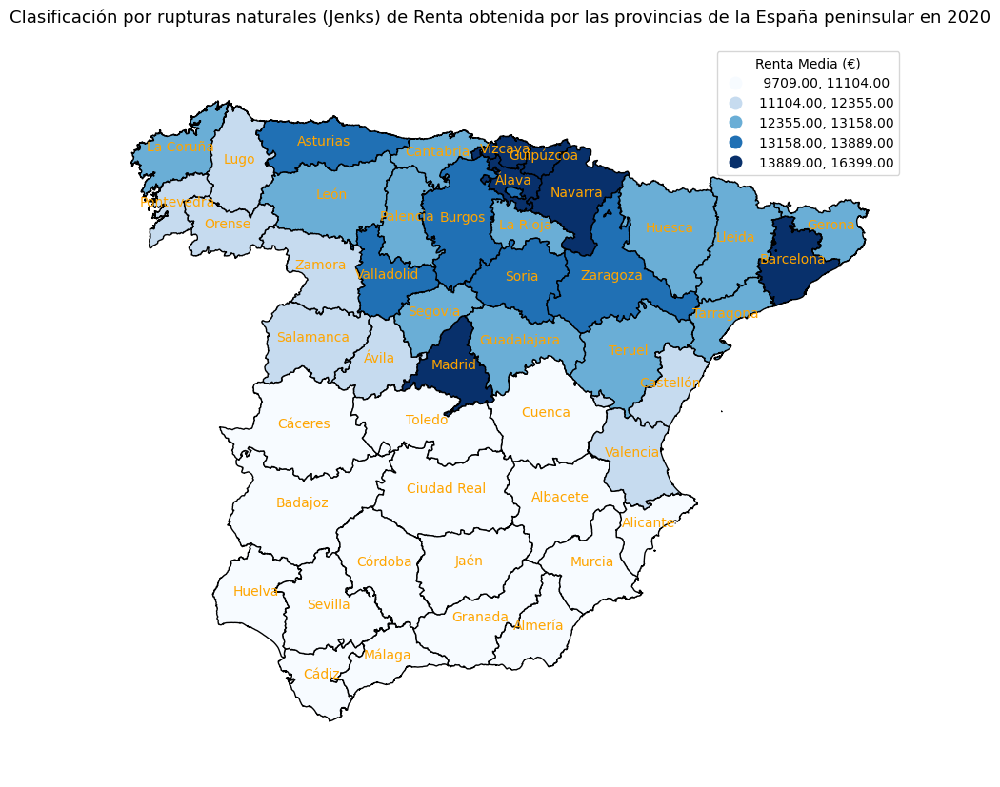

In [33]:
#visualizacion de los datos de renta
f, ax = plt.subplots(1, figsize=(11,10))
ax.set_title('Clasificación por rupturas naturales (Jenks) de Renta obtenida por las provincias de la España peninsular en 2020', size = 13)
gdf.apply(lambda x: ax.annotate(text=x['Texto'], xy=x.geometry.centroid.coords[0], ha='center', color ='Orange'), axis=1);
gdf.plot(ax=ax, column='Renta 2020', scheme='fisher_jenks',k=5, cmap='Blues', edgecolor='black',legend=True,legend_kwds={'title':"Renta Media (€)", 'loc': 'upper right'}) #parametros introducidos

plt.axis('equal')
plt.axis('off')

## Clasificación por cuantiles 

(-65895.31091992318, 1073717.0378864056, 3943505.1063331645, 4902846.097091313)

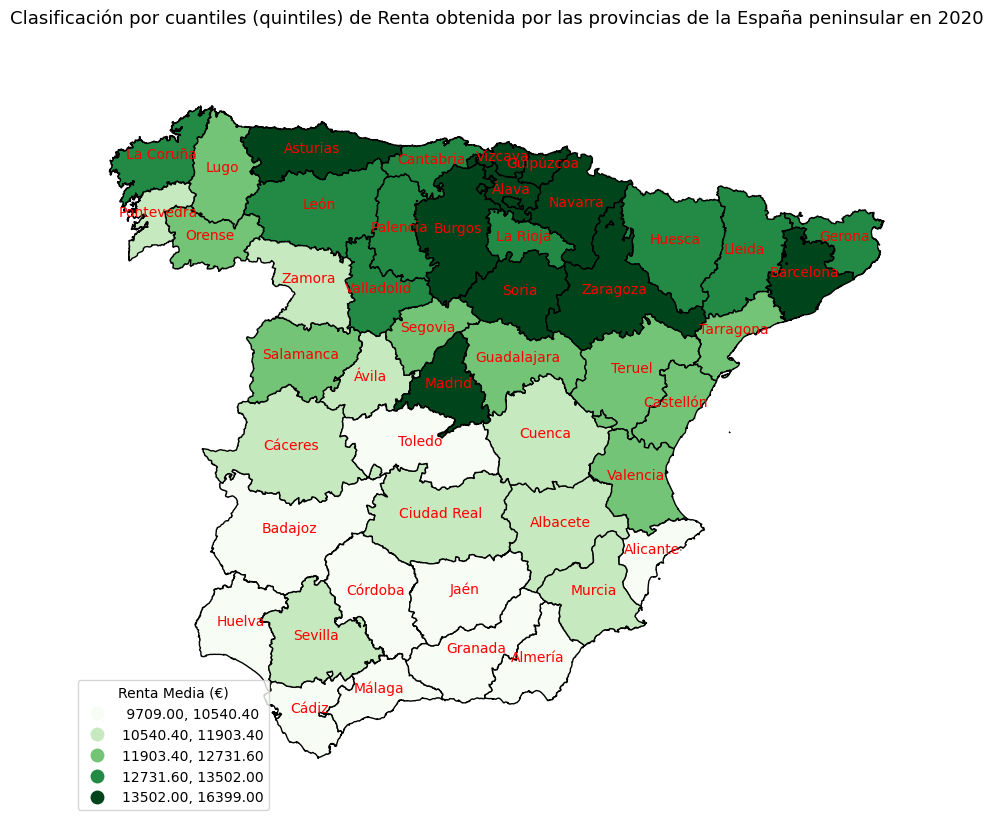

In [34]:
#Cuantiles del mapa (quintiles)

f, ax = plt.subplots(1, figsize=(11,10))
ax.set_title('Clasificación por cuantiles (quintiles) de Renta obtenida por las provincias de la España peninsular en 2020', size = 13)
gdf.apply(lambda x: ax.annotate(text=x['Texto'], xy=x.geometry.centroid.coords[0], ha='center', color ='red'), axis=1);
gdf.plot(ax=ax, column='Renta 2020', scheme='quantiles', k=5, cmap='Greens', edgecolor='black',legend=True,legend_kwds={'title':"Renta Media (€)", 'loc': 'lower left'}) #parametros introducidos

plt.axis('equal')
plt.axis('off')

## Desviación estándar

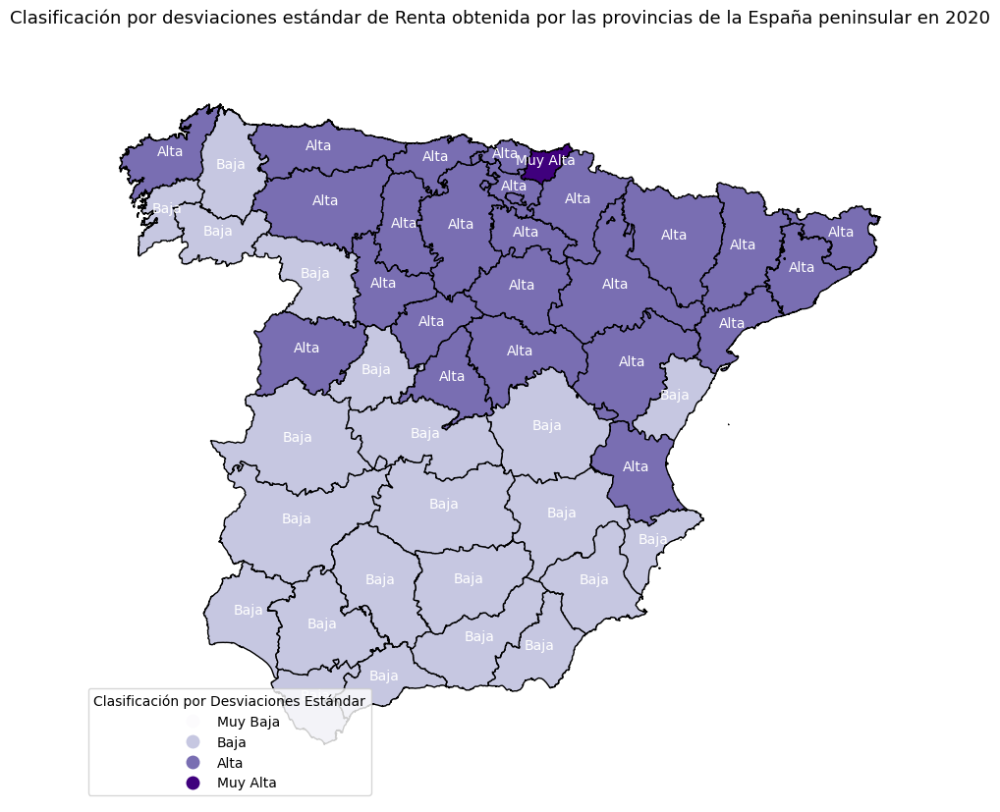

In [35]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Supongamos que 'gdf' es tu GeoDataFrame con la columna 'Renta_2020'

# Calcular la media y la desviación estándar
media = gdf['Renta 2020'].mean()
desviacion_estandar = gdf['Renta 2020'].std()

# Definir los límites de clasificación en términos de desviaciones estándar
limite_inferior = media - 2 * desviacion_estandar
limite_superior = media + 2 * desviacion_estandar

# Clasificar los datos en función de las desviaciones estándar
gdf['clasificacion'] = pd.cut(gdf['Renta 2020'], bins=[-float('inf'), limite_inferior, media, limite_superior, float('inf')], labels=['Muy Baja', 'Baja', 'Alta', 'Muy Alta'])

# Crear el mapa
f, ax = plt.subplots(1, figsize=(11, 10))
ax.set_title('Clasificación por desviaciones estándar de Renta obtenida por las provincias de la España peninsular en 2020', size=13)
gdf.apply(lambda x: ax.annotate(text=x['clasificacion'], xy=x.geometry.centroid.coords[0], ha='center', color='white'), axis=1)
gdf.plot(ax=ax, column='clasificacion', cmap='Purples', edgecolor='black', legend=True, legend_kwds={'title': "Clasificación por Desviaciones Estándar", 'loc': 'lower left'})

plt.axis('equal')
plt.axis('off')
plt.show()

## BoxPlot

Text(0.5, 1.0, 'Boxplot de Renta obtenida por las provincias de la España peninsular de 2019 a 2021')

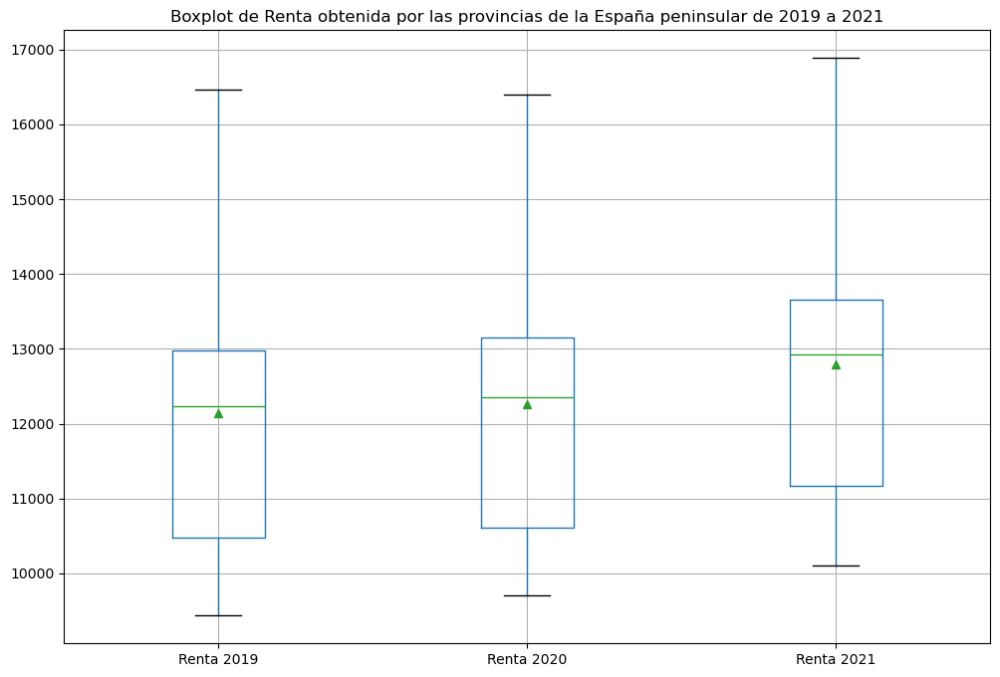

In [36]:
cols = ["Renta 2019","Renta 2020", "Renta 2021"]
%matplotlib inline
gdf[cols].boxplot(showmeans='True', showbox='True', figsize=(12,8))
plt.title('Boxplot de Renta obtenida por las provincias de la España peninsular de 2019 a 2021')

La observación de un crecimiento en los mínimos y un aumento en las posiciones de las cajas en un boxplot indica un cambio en la distribución de los datos a lo largo del tiempo para las variables "Renta 2019", "Renta 2020" y "Renta 2021".

Análisis:

1. **Crecimiento en los mínimos de las cajas:**
   - Los "mínimos de las cajas" en un boxplot representan el primer cuartil (Q1) de los datos, que es el valor por debajo del cual se encuentra el 25% de los datos. Un aumento en los mínimos indica que la parte inferior del conjunto de datos ha experimentado un crecimiento a lo largo del tiempo. Esto podría sugerir un incremento en los valores más bajos de la variable "Renta" en las provincias de la España peninsular.

2. **Aumento en las posiciones de las cajas:**
   - La "posición de la caja" en un boxplot se refiere a la mediana (o segundo cuartil, Q2) de los datos. Un aumento en la posición de las cajas indica que la mediana de la distribución de la renta ha experimentado un incremento. Esto sugiere un cambio en la ubicación central de los datos hacia valores más altos.

3. **Máximos que no muestran un aumento significativo:**
   - La "longitud de las cajas" y los "máximos de las cajas" en un boxplot están relacionados con el rango intercuartil (IQR), que es la distancia entre el primer cuartil (Q1) y el tercer cuartil (Q3). Si los máximos no muestran un aumento significativo, esto podría indicar que, a pesar de los cambios en los mínimos y las posiciones de las cajas, la parte superior del conjunto de datos no ha experimentado un crecimiento tan marcado.



## ¿Cuál es la provincia con mayor renta en 2021?

(-65895.31091992318, 1073717.0378864056, 3943505.1063331645, 4902846.097091313)

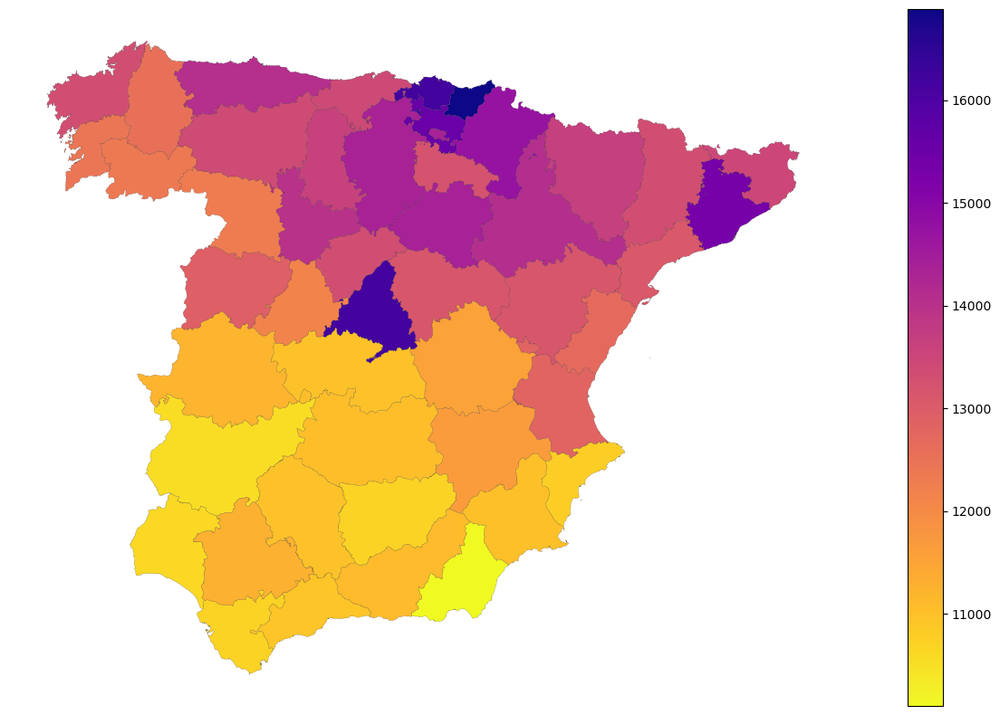

In [37]:
import matplotlib.pyplot as plt
gdf.plot("Renta 2021", cmap="plasma_r", linewidth=0.1, edgecolor='black', figsize=(20,10),legend='true')
plt.axis('off')

La visualización que se describe sugiere que la variable "Renta 2021" en las provincias de la península muestra un patrón espacial en el que ciertas áreas, especialmente en el norte-este, tienen valores más bajos en comparación con otras áreas, que son más oscuras. Además, Madrid parece ser una excepción, con valores más altos.

Análisis:

1. **Oscurecimiento hacia el norte:**
   - La variación en la oscuridad en la visualización representa la variabilidad de la variable "Renta 2021" en diferentes áreas geográficas. Un oscurecimiento hacia el norte-este sugiere que, en general, las provincias en esa dirección tienen valores de renta más bajos en comparación con otras áreas.

2. **¿Madrid?:**
   - La excepción de Madrid, más oscura, indica que tiene valores de renta más altos en comparación con las áreas circundantes. Este patrón contrasta con el oscurecimiento general hacia el norte-este y resalta la posición relativamente favorable de Madrid en términos de renta.

3. **Análisis espacial:**
   - Es resultado de diversos factores económicos, geográficos o sociales que contribuyen a la variabilidad de la renta en la península. País Vasco es la Comunidad Autónoma con mayor renta y Guipuzkoa, la provincia con mayor renta de España.

In [38]:
gdf.explore("Renta 2021", legend=True)

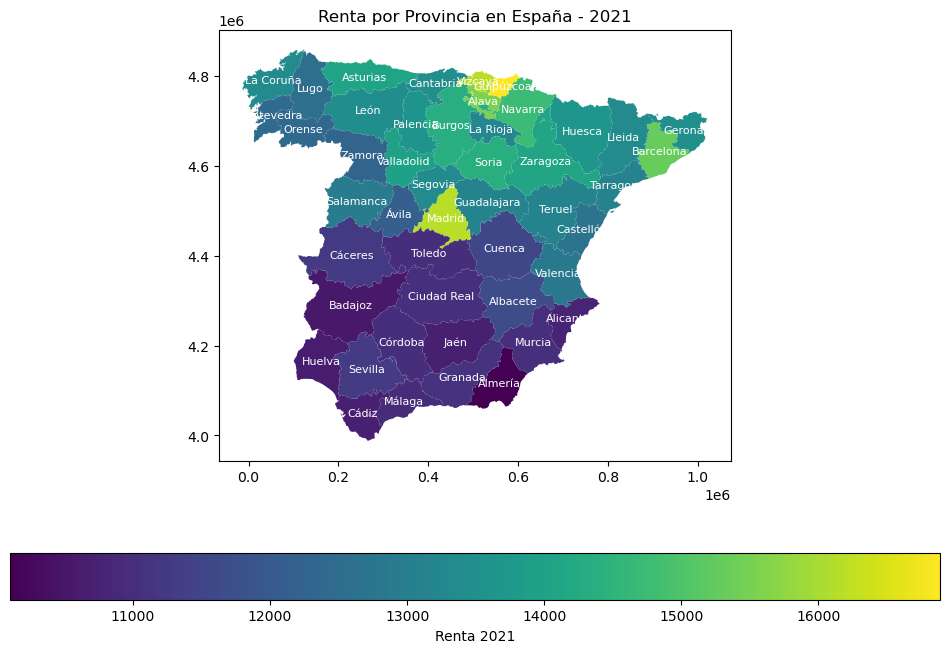

In [39]:
import geopandas as gpd
import matplotlib.pyplot as plt

# Explorar el GeoDataFrame con ventana emergente
gdf.plot(column='Renta 2021', legend=True, figsize=(12, 8), legend_kwds={'label': "Renta 2021", 'orientation': "horizontal"})
plt.title('Renta por Provincia en España - 2021')

# Agregar etiquetas de provincia como texto emergente en el mapa
for x, y, label in zip(gdf.geometry.centroid.x, gdf.geometry.centroid.y, gdf['Texto']):
    plt.text(x, y, label, fontsize=8, ha='center', va='center', color='white')

# Mostrar el mapa
plt.show()

## Histograma

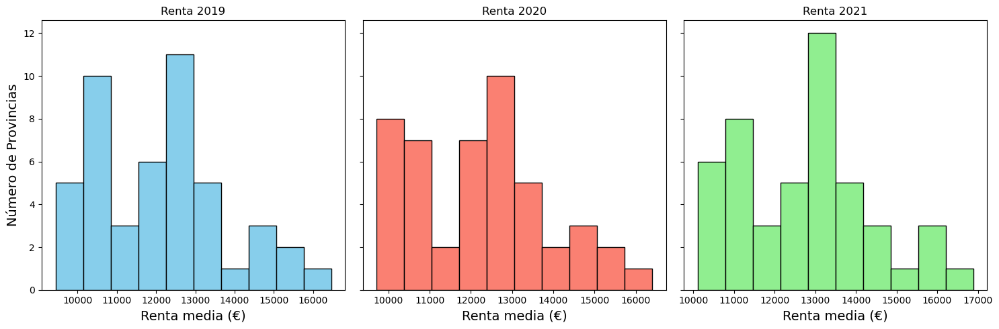

In [40]:
# 'gdf' es GeoDataFrame con las columnas 'Renta_2019', 'Renta_2020', 'Renta_2021'
# y que se quiere crear un histograma para cada año.

# Crear subplots con 1 fila y 3 columnas
fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

# Histograma para Renta 2019
gdf['Renta 2019'].plot(kind='hist', ax=axs[0], edgecolor='black', color='skyblue')
axs[0].set_title('Renta 2019')
axs[0].set_xlabel('Renta media (€)', fontsize=14)
axs[0].set_ylabel('Número de Provincias', fontsize=14)

# Histograma para Renta 2020
gdf['Renta 2020'].plot(kind='hist', ax=axs[1], edgecolor='black', color='salmon')
axs[1].set_title('Renta 2020')
axs[1].set_xlabel('Renta media (€)', fontsize=14)

# Histograma para Renta 2021
gdf['Renta 2021'].plot(kind='hist', ax=axs[2], edgecolor='black', color='lightgreen')
axs[2].set_title('Renta 2021')
axs[2].set_xlabel('Renta media (€)', fontsize=14)

# Ajustar el diseño de los subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

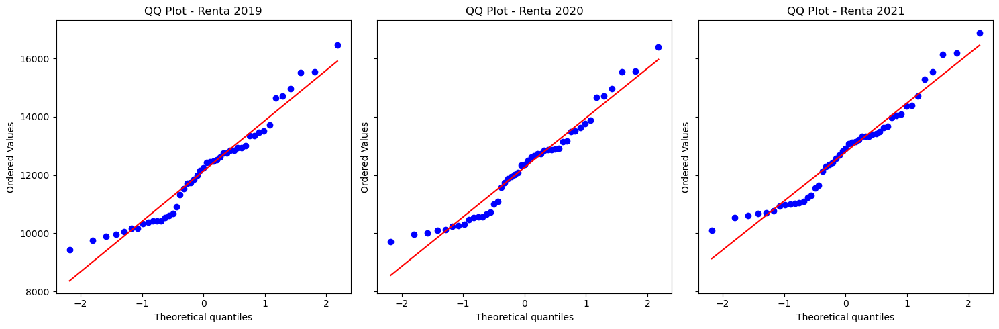

In [41]:
import matplotlib.pyplot as plt
from scipy.stats import probplot

# Supongamos que 'gdf' es tu GeoDataFrame con las columnas 'Renta_2019', 'Renta_2020', 'Renta_2021'
# y que deseas crear un QQ plot para cada año.

# Crear subplots con 1 fila y 3 columnas
fig, axs = plt.subplots(1, 3, figsize=(15, 5), sharey=True)

# QQ plot para Renta 2019
probplot(gdf['Renta 2019'], dist='norm', fit=True, plot=axs[0])
axs[0].set_title('QQ Plot - Renta 2019')

# QQ plot para Renta 2020
probplot(gdf['Renta 2020'], dist='norm', fit=True, plot=axs[1])
axs[1].set_title('QQ Plot - Renta 2020')

# QQ plot para Renta 2021
probplot(gdf['Renta 2021'], dist='norm', fit=True, plot=axs[2])
axs[2].set_title('QQ Plot - Renta 2021')

# Ajustar el diseño de los subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

La Renta media de 2019, 2020 y 2021 no siguen una distribución normal, puesto que muestran una significativa desviación de los valores esperados tanto en la parte más baja como en la más alta de la distribución. Estas tres observaciones sugieren que la variabilidad en la renta media de las provincias es notoria, con diferencias significativas tanto en las regiones con los valores más bajos (Sur de España) como en aquellas con los valores más altos (Norte de España) a lo largo de estos tres años.

### Representación compuesta de la distribución de la Renta con variogramas y semivariogramas

/home/bdg/anaconda3/envs/crime/lib/python3.11/site-packages/skgstat/plotting/variogram_dd_plot.py:46: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown

/home/bdg/anaconda3/envs/crime/lib/python3.11/site-packages/skgstat/plotting/variogram_plot.py:123: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown

/home/bdg/anaconda3/envs/crime/lib/python3.11/site-packages/skgstat/plotting/variogram_dd_plot.py:46: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown

/home/bdg/anaconda3/envs/crime/lib/python3.11/site-packages/skgstat/plotting/variogram_plot.py:123: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown

/home/bdg/anaconda3/envs/crime/lib/python3.11/site-packages/skgstat/plotting/variogram_dd_plot.py:46: UserWarning:

FigureCanvasAgg is non-interactive, and thus cannot be shown

/home/bdg/anaconda3/envs/crime/lib/python3.11/site-packages/skgstat/plotting/variogram_plot.py:123: UserWarning:



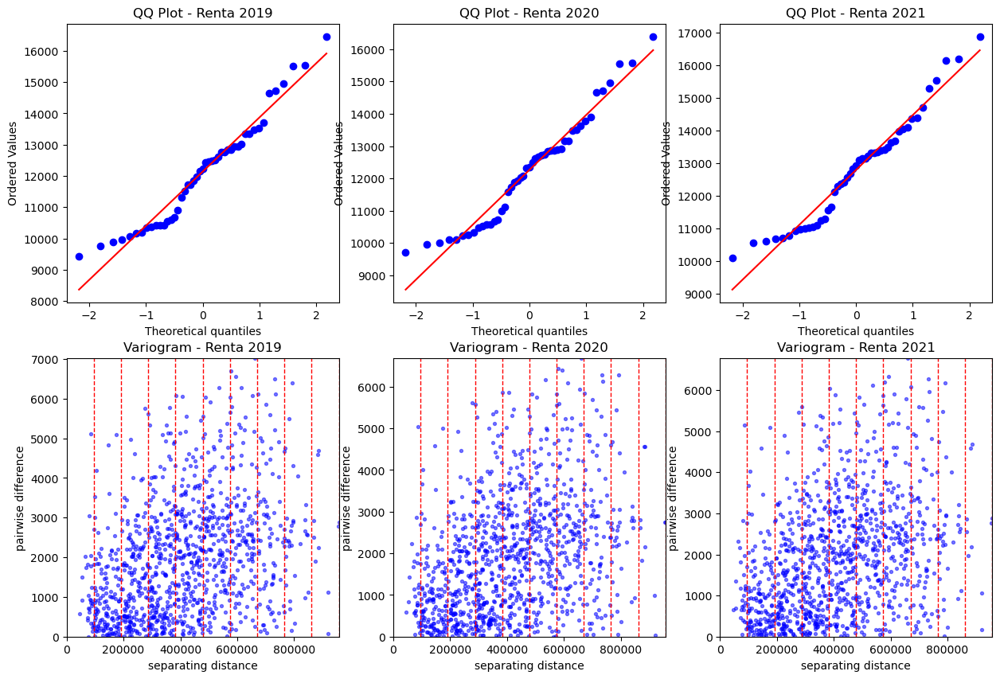

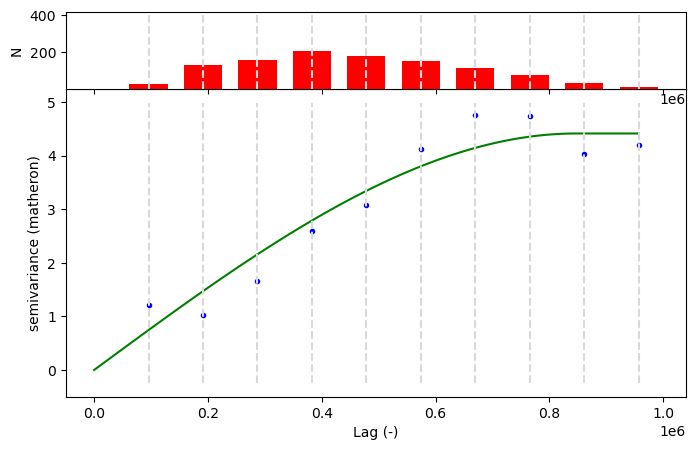

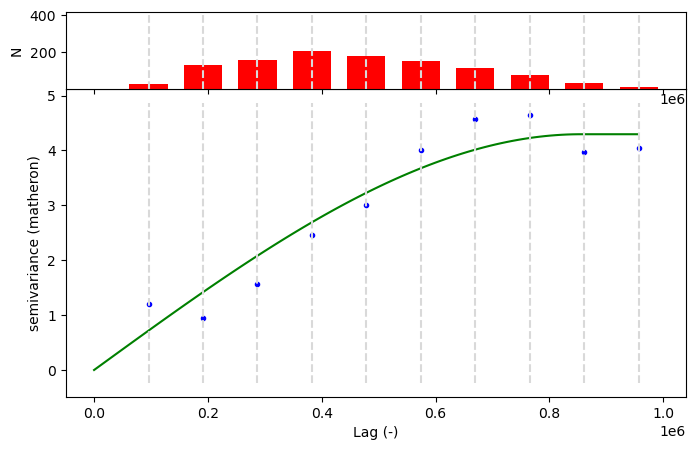

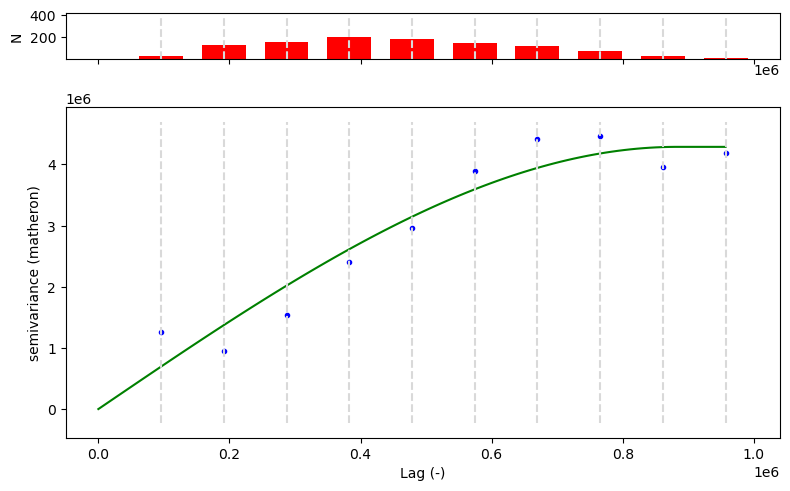

In [42]:
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.stats import probplot
import skgstat as skg

# Supongamos que 'gdf' es tu GeoDataFrame con las columnas 'Renta_2019', 'Renta_2020', 'Renta_2021'
# y que deseas crear un QQ plot para cada año.

# Crear subplots con 2 filas y 3 columnas (para los QQ plots y los variogramas)
fig, axs = plt.subplots(2, 3, figsize=(15, 10))

# Iterar sobre cada año y crear QQ plot y variograma
for i, año in enumerate(['Renta 2019', 'Renta 2020', 'Renta 2021']):
    # Cambiar la "geometría" de "polígono" a "centroide" (punto central del polígono)
    gdf["centroid"] = gdf.centroid
    gdf['x'] = gdf['centroid'].x
    gdf['y'] = gdf['centroid'].y

    coordinates = gdf[['x', 'y']].values
    list_values = gdf[año].values

    # Crear un nuevo subplot para cada año (QQ plots)
    ax_qq = axs[0, i]

    # Crear el QQ plot
    probplot(list_values, plot=ax_qq)
    
    # Ajustar el título del subplot
    ax_qq.set_title(f'QQ Plot - {año}')

    # Crear un nuevo subplot para cada año (variogramas)
    ax_variogram = axs[1, i]

    # Cálculo del variograma
    V = skg.Variogram(coordinates=coordinates, values=list_values, model='spherical', use_nugget=True, n_lags=10)

    # Visualización del variograma
    V.distance_difference_plot(ax=ax_variogram)
    V.plot()

    # Ajustar el título del subplot
    ax_variogram.set_title(f'Variogram - {año}')

# Ajustar el diseño de los subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

La segunda representación son variogramas que examinan la relación entre la renta media en estos tres años y la ubicación geográfica representada por el centroide de cada provincia. Este variograma busca describir estadísticamente la relación entre estas variables mediante la varianza, (eje vertical). La distancia entre dos ubicaciones influye en la variabilidad de los valores asociados a esas ubicaciones, y el variograma captura cómo esta variabilidad cambia con la distancia.

En el otro gráfico (semivariograma), se presentan los valores empíricos de la covarianza para todos los pares de ubicaciones dentro del conjunto de datos en función de la distancia que separa esas ubicaciones. Se espera que varianza aumente con la distancia, y este patrón se refleja en la figura, mostrando una nube de covarianzas que sigue la tendencia esperada de incremento de la variabilidad con la distancia. Estas representaciones proporcionan una visión detallada de la estructura espacial de la renta media a lo largo de los tres años considerados.

## Cálculo del Índice de Autocorrelación I de Moran

In [43]:
import libpysal
from libpysal.weights import Queen #otros pesos: Rook, KNN
w_queen = Queen.from_dataframe(gdf) 
w_queen.n

47

In [44]:
w_queen.neighbors[0]

[18, 7, 24, 44, 29]

In [45]:
gdf['Texto'][[0, 18, 7, 24, 44, 29]]

0           Álava
18    Guadalajara
7       Barcelona
24         Lleida
44     Valladolid
29         Murcia
Name: Texto, dtype: object

In [46]:
Renta_2019 = gdf['Renta 2019']
from esda.moran import Moran
mi = Moran(Renta_2019, w_queen, permutations=99999)
"%6.4f" % mi.I

'0.6766'

In [47]:
#Valor p (aproximación normal estándar de permutaciones)
mi.p_norm

7.325034743747136e-14

El índice de Moran calculado utilizando la matriz de pesos de queen es de 0,6766, lo que sugiere una autocorrelación espacial positiva con un alto grado de agrupación de los datos. Este resultado indica que las regiones vecinas tienen valores similares, y existe un patrón significativo de agrupación espacial en forma de clusters.

En consecuencia, se rechaza la hipótesis nula que plantea la inexistencia de agrupación espacial (clustering). El p valor obtenido, 7,325034743747136e-14, indica que hay menos del 0,1% de probabilidad de que el patrón de agrupación observado sea el resultado de un fenómeno aleatorio. Este p valor se interpreta en relación con una distribución de referencia basada en permutaciones espaciales aleatorias bajo la hipótesis nula de "Existe una aleatoriedad espacial completa en los datos".

### Resultados del índice de Moran para visualizar la autocorrelación espacial

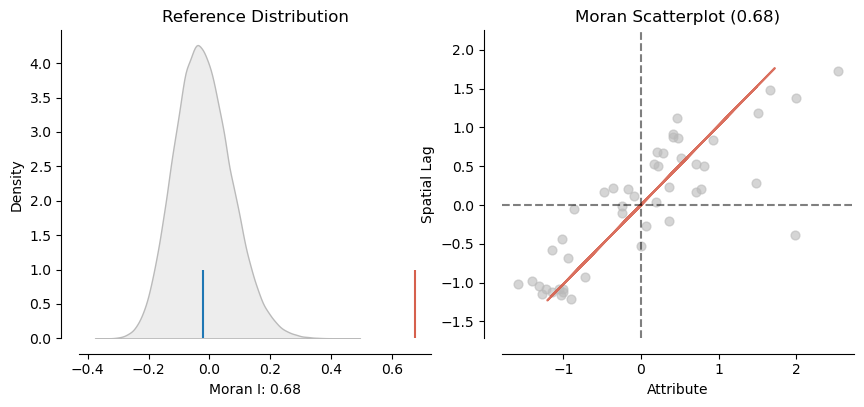

In [48]:
from splot.esda import plot_moran

plot_moran(mi, zstandard=True, figsize=(10,4))
plt.show()

## Índice I de Moran global (k vecinos más próximos)

In [49]:
from libpysal.weights import KNN
#5 vecinos más próximos
w5v = KNN.from_dataframe(gdf, k=5) 
#Índice I global de Moran, con 5 vecinos
mi2 = Moran(Renta_2019, w5v, permutations=9999) 
"%6.4f" % mi2.I 

'0.6412'

In [50]:
mi2.p_norm #valor p

3.671997663837691e-16

Bajo este enfoque, podemos reafirmar la presencia de una autocorrelación espacial positiva, aunque el valor del índice disminuye a 0,6412. El p valor asociado sigue siendo estadísticamente significativo, con un nivel de significación superior al 99,9%. Esto indica que hay menos de un 0,1% de probabilidad de que el patrón de agrupación observado sea el resultado de un fenómeno aleatorio.

En consecuencia, nuevamente se puede rechazar la hipótesis nula que sostiene la inexistencia de agrupación espacial (clustering). La evidencia respalda la presencia de una estructura espacial significativa en los datos analizados, destacando la importancia de la autocorrelación espacial positiva en el fenómeno estudiado.

In [51]:
from esda.moran import Moran_Local

#  calcular Moran_Local y dibuja
moran_loc_2019 = Moran_Local(Renta_2019, w_queen, permutations=9999)
moran_loc_2019

# revisar también https://pysal.org/esda/generated/esda.Moran_Local.html

### Diagrama de dispersión de Moran

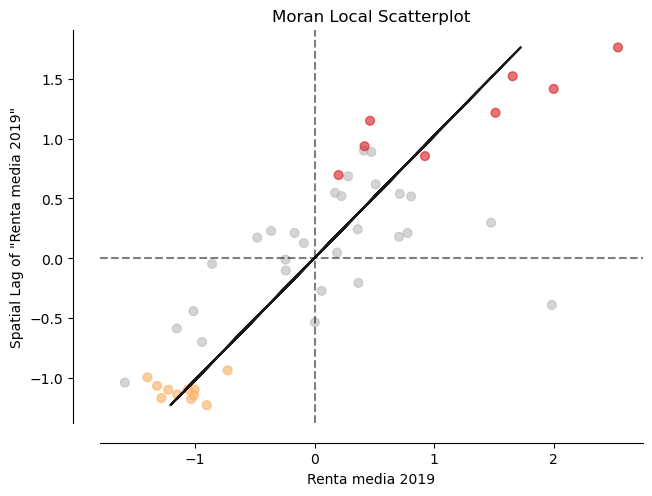

In [52]:
from splot.esda import moran_scatterplot
fig, ax = moran_scatterplot(moran_loc_2019, p=0.05)
ax.set_xlabel('Renta media 2019')
ax.set_ylabel('Spatial Lag of "Renta media 2019"')
plt.show()

El cuadrante superior izquierdo sugiere que los polígonos con valores bajos están rodeados de polígonos con valores altos (LH), mientras que el cuadrante inferior derecho indica que los polígonos con valores altos están rodeados de vecinos con valores bajos (HL).

In [53]:
import geopandas as gpd
from pysal.explore import esda
from pysal.lib import weights

# Calcular pesos espaciales (utilizando, por ejemplo, vecinos más cercanos)
w = weights.KNN.from_dataframe(gdf, k=5)

# Calcular el índice de Moran global
moran = esda.Moran(gdf['Renta 2019'], w)

# Mostrar los resultados
print("Índice de Moran Global:", moran.I)
print("Valor p:", moran.p_sim)


Índice de Moran Global: 0.6411874625836875
Valor p: 0.001


## Autocorrelación espacial Local

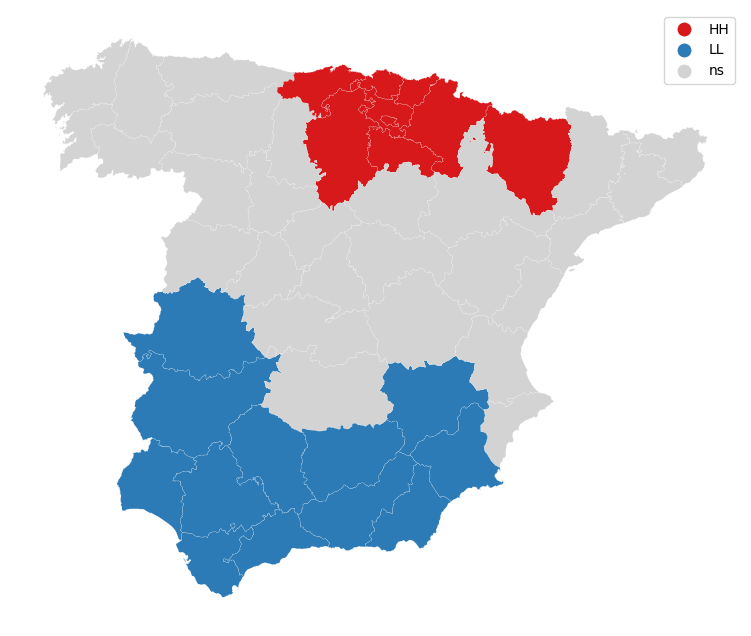

In [54]:
import geopandas as gpd
from pysal.explore import esda
from pysal.lib import weights
from splot.esda import moran_scatterplot, lisa_cluster

# Calcular pesos espaciales (utilizando, por ejemplo, vecinos más cercanos)
w = weights.KNN.from_dataframe(gdf, k=5)

# Calcular el índice de Moran local
lisa = esda.Moran_Local(gdf['Renta 2019'], w)

# Visualizar los clusters significativos
lisa_cluster(lisa, gdf, p=0.05, figsize=(12, 8))
plt.show()

Los valores en la lista p_thresS representan diferentes niveles de significancia estadística que se utilizan para identificar patrones espaciales locales. Estos niveles (como 0.2, 0.1, 0.05, 0.01, 0.001) se comparan con p valores calculados en un análisis espacial. Cuanto menor sea el p valor, mayor es la evidencia estadística de un patrón espacial significativo.

Estos valores representan, respectivamente, niveles de significancia del 20%, 10%, 5%, 1%, y 0.1%.

<Figure size 2100x1700 with 0 Axes>

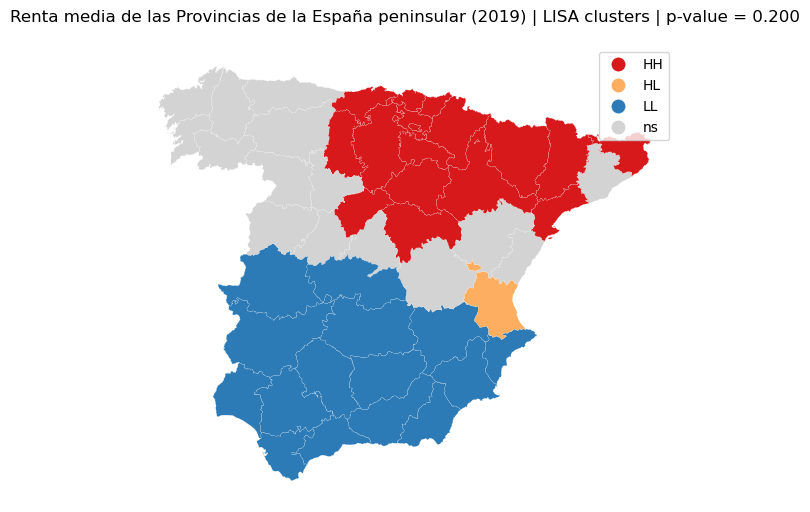

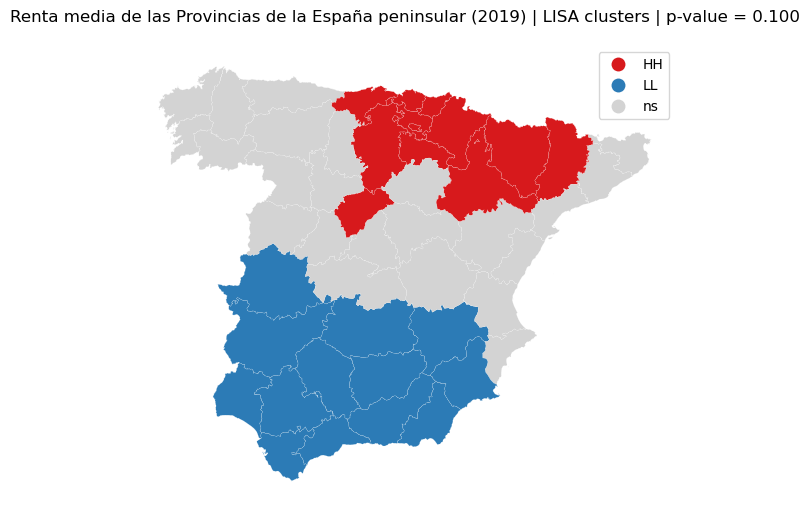

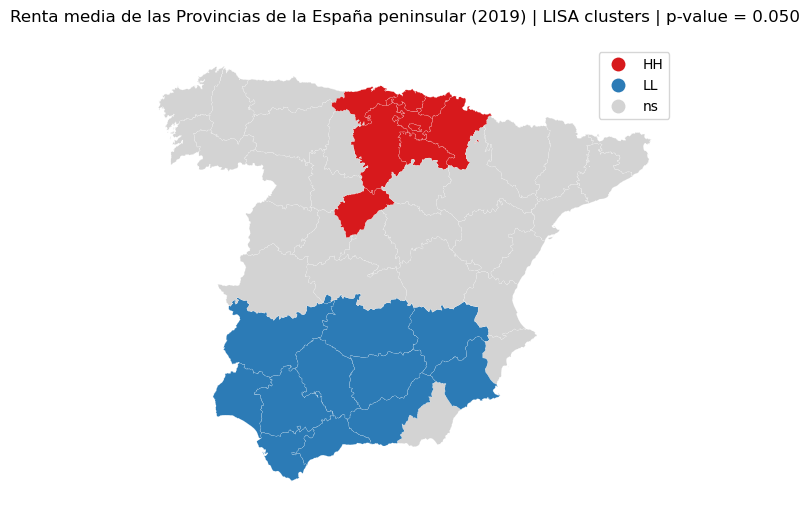

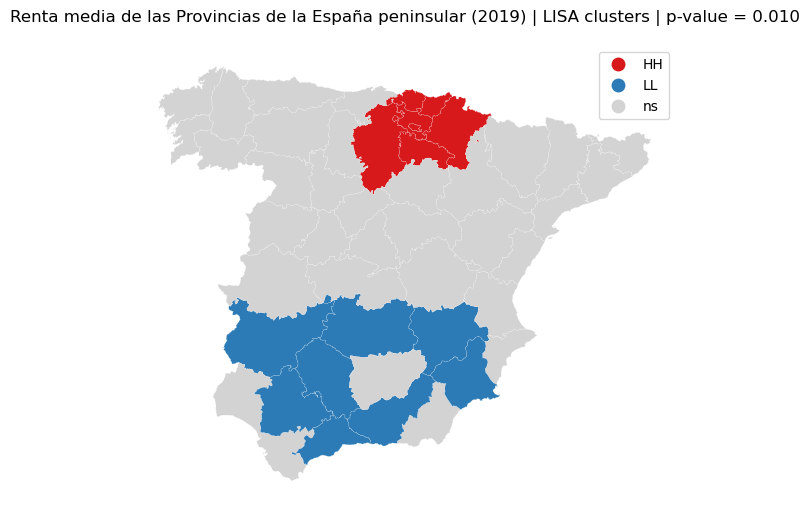

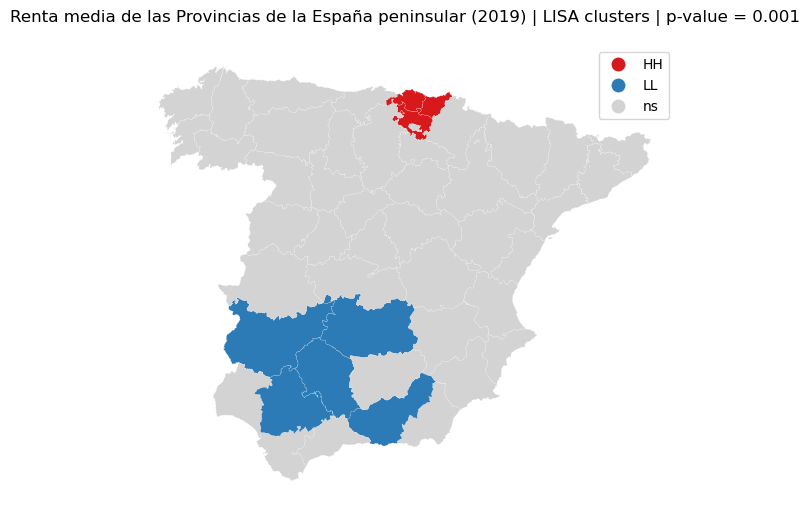

In [55]:
p_thresS = [0.2, 0.1, 0.05, 0.01, 0.001] #¿En qué estructura de Python se almacenan los valores p?
f = plt.figure(figsize=(21, 17))
#cálculo de los valores LISA para cada valor p, con un bucle "for"
for i, p_thres in enumerate(p_thresS):
    lisa_cluster(moran_loc_2019, gdf, p_thres, figsize = (7,7))
    plt.title('Renta media de las Provincias de la España peninsular (2019) | LISA clusters | p-value = %.3f'%p_thres)
    plt.show()

Los valores en la lista p_thresS representan diferentes niveles de significancia estadística que se utilizan para identificar patrones espaciales locales. Estos niveles (como 0.2, 0.1, 0.05, 0.01, 0.001) se comparan con p valores calculados en un análisis espacial. Cuanto menor sea el p valor, mayor es la evidencia estadística de un patrón espacial significativo. El código proporcionado utiliza estos valores para visualizar patrones locales en datos geográficos a diferentes niveles de confianza estadística.

En el contexto de un análisis LISA (Local Indicators of Spatial Association), se utilizan diferentes códigos para describir los patrones espaciales locales. Estos códigos representan las combinaciones de valores altos (H, High) y bajos (L, Low) en una variable en un área específica y sus áreas vecinas. Los códigos comunes son:

- **HH (High-High):** Representa áreas con valores altos rodeadas principalmente por áreas con valores altos. Indica la presencia de clusters locales de altos valores.

- **HL (High-Low):** Indica áreas con valores altos rodeadas por áreas con valores bajos. Esto sugiere un patrón de valores altos en áreas aisladas.

- **LH (Low-High):** Representa áreas con valores bajos rodeadas principalmente por áreas con valores altos. Indica la presencia de clusters locales de bajos valores.

- **LL (Low-Low):** Indica áreas con valores bajos rodeadas principalmente por áreas con valores bajos. Refleja la presencia de clusters locales de bajos valores.

- **NS (Not Significant):** Los valores no muestran patrones espaciales locales significativos.


## Gráficos de Autocorrelación espacial local

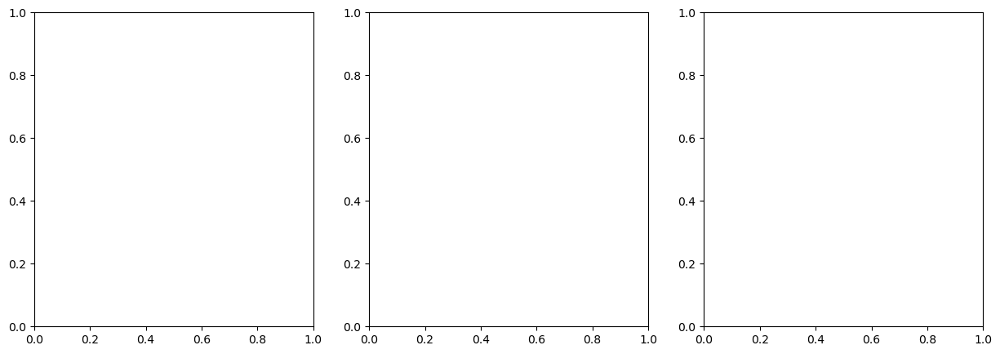

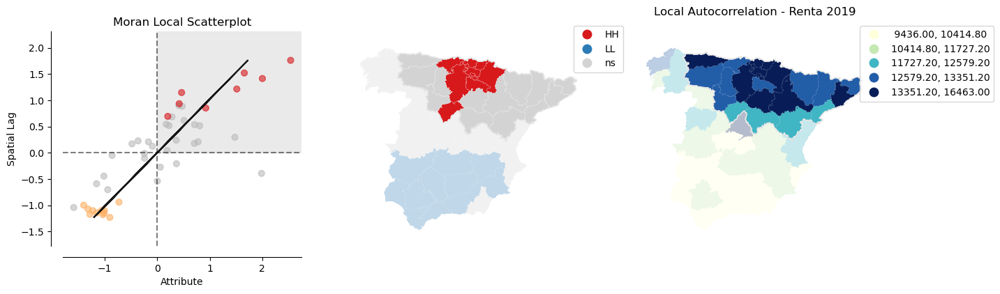

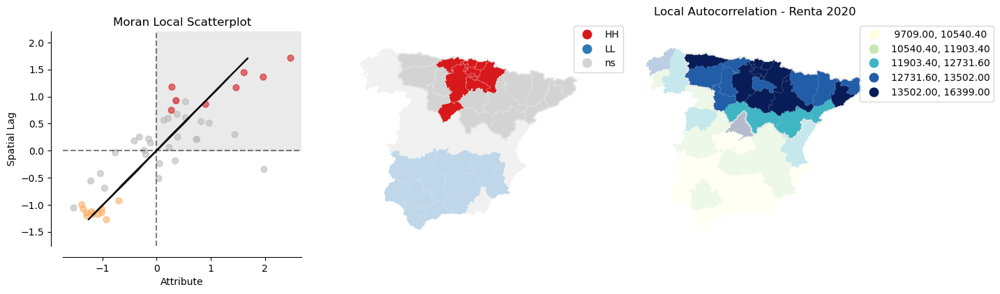

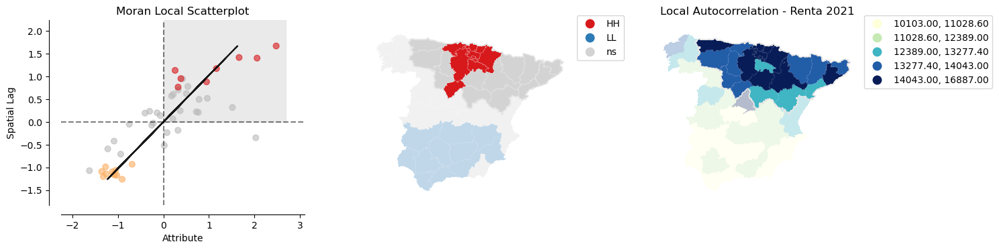

In [56]:
import geopandas as gpd
import matplotlib.pyplot as plt
from splot.esda import plot_local_autocorrelation
from esda.moran import Moran

#  calcular Moran_Local y dibuja
Renta_2020 = gdf['Renta 2020']
moran_loc_2020 = Moran_Local(Renta_2020,w_queen, permutations=9999)
moran_loc_2020

Renta_2021 = gdf['Renta 2021']
moran_loc_2021 = Moran_Local(Renta_2021,w_queen, permutations=9999)
moran_loc_2021

# Supongamos que 'gdf' es GeoDataFrame con las columnas 'Renta_2019', 'Renta_2020', 'Renta_2021'
# índice de Moran para cada año (moran_loc_2019, moran_loc_2020, moran_loc_2021)

# Crear subplots con 1 fila y 3 columnas
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Iterar sobre cada año y crear gráficos
for i, año in enumerate(['Renta 2019', 'Renta 2020', 'Renta 2021']):
    # Seleccionar el índice de Moran correspondiente al año actual
    moran_loc = eval(f'moran_loc_{año[-4:]}')  # Suponiendo que has nombrado tus objetos moran_loc_2019, moran_loc_2020, moran_loc_2021
    
    # Crear un nuevo subplot para cada año
    plt.subplot(1, 3, i + 1)
    
    # Crear el gráfico de autocorrelación local
    plot_local_autocorrelation(moran_loc, gdf, año, quadrant=1)
    
    # Ajustar el título del subplot
    plt.title(f'Local Autocorrelation - {año}')

# Ajustar el diseño de los subplots
plt.tight_layout()

# Mostrar el gráfico
plt.show()

Estas representaciones visuales consolidan y refuerzan la comprensión de la distribución y tendencias previamente observadas.

# Análsis Criminalidad - Renta Media

In [57]:
#datos principales
gdf.head()

,Cod,Nombre,Renta 2021,Renta 2020,Renta 2019,IDPROV,Texto,Texto_Alt,Cod_CCAA,CCAA,geometry,clasificacion,centroid,x,y
0,01,Álava,15539.0,14962.0,14962.0,01,Álava,Araba,16,País Vasco,"POLYGON ((497823.750 4784874.150, 498456.775 4...",Alta,POINT (522877.243 4742531.552),522877.242736,4.742532e+06
1,02,Albacete,11652.0,11104.0,10901.0,02,Albacete,Albacete,08,Castilla - La Mancha,"POLYGON ((630529.311 4364287.687, 630118.311 4...",Baja,POINT (588470.454 4297856.005),588470.453939,4.297856e+06
2,03,Alicante,10770.0,10236.0,10177.0,03,Alicante,Alacant,10,Comunitat Valenciana,"MULTIPOLYGON (((720290.776 4227118.177, 720292...",Baja,POINT (711975.254 4261682.977),711975.253776,4.261683e+06
3,04,Almería,10103.0,9709.0,9436.0,04,Almería,Almería,01,Andalucía,"MULTIPOLYGON (((572241.564 4064120.709, 572219...",Baja,POINT (558046.556 4116761.328),558046.555815,4.116761e+06
4,05,Ávila,12123.0,11577.0,11322.0,05,Ávila,Ávila,07,Castilla y León,"POLYGON ((331047.917 4558945.287, 331286.923 4...",Baja,POINT (335252.141 4492902.334),335252.141417,4.492902e+06


In [58]:
# Casos totales de Crimen por Provincia
crime_shp.head()

,IDPROV,Texto,Texto_Alt,Cod_CCAA,CCAA,geometry,Cod,Location,latitude,longitude,Total cases
0,03,Alicante,Alacant,10,Comunitat Valenciana,"MULTIPOLYGON (((720290.776 4227118.177, 720292...",03,Alicante,38.3436365,-0.4881708,254633
1,08,Barcelona,Barcelona,09,Cataluña,"MULTIPOLYGON (((885039.022 4672988.012, 885646...",08,Barcelona,41.3828939,2.1774322,985235
2,14,Córdoba,Córdoba,01,Andalucía,"MULTIPOLYGON (((316397.659 4168637.693, 318800...",14,Cordoba,37.8845813,-4.7760138,72845
3,18,Granada,Granada,01,Andalucía,"MULTIPOLYGON (((465193.305 4062565.436, 465158...",18,Granada,37.1734995,-3.5995337,97560
4,26,La Rioja,La Rioja,17,"Rioja, La","POLYGON ((500227.096 4721076.266, 500824.099 4...",26,Rioja,42.3285528,-2.4674917,27182


In [59]:
# Unímos los dataframes
crimen_renta = pd.merge(gdf, crime_shp, on='Cod', how='inner')
crimen_renta.shape

(13, 25)

In [60]:
dfc

,Location,Year,Crime,Total cases,latitude,longitude
0,Barcelona,2021,Intentional homicides and consummated murders,36,41.382894,2.177432
1,Barcelona,2021,Intentional homicides and attempted murders,137,41.382894,2.177432
2,Barcelona,2021,Serious and less serious crimes of injuries an...,2161,41.382894,2.177432
3,Barcelona,2021,Kidnapping,8,41.382894,2.177432
4,Barcelona,2021,Crimes against freedom and sexual indemnity,2406,41.382894,2.177432
...,...,...,...,...,...,...
625,Melilla,2021,Robberies with force in homes,55,35.291870,-2.940903
626,Melilla,2021,Theft,576,35.291870,-2.940903
627,Melilla,2021,Vehicle theft,35,35.291870,-2.940903
628,Melilla,2021,Drug trafficking,230,35.291870,-2.940903


In [61]:
#Ordenamos el DataFrame y Obtenemos los casos totales del año 2019
crime_Year = pd.DataFrame(dfc.groupby(['Location', 'latitude', 'longitude', 'Year'])['Total cases'].sum()) 
crime_Year.reset_index(inplace=True) 
crime_Year = crime_Year[crime_Year['Year'] == 2019]
crime_Year.rename(columns={'Total cases': 'Total cases 2019'}, inplace=True)
crime_Year 

,Location,latitude,longitude,Year,Total cases 2019
0,Alicante,38.343637,-0.488171,2019,96523
3,Barcelona,41.382894,2.177432,2019,404552
6,Ceuta,35.894422,-5.355817,2019,4854
9,Cordoba,37.884581,-4.776014,2019,26617
12,Granada,37.173499,-3.599534,2019,35446
15,Madrid,40.416705,-3.703582,2019,423399
18,Malaga,36.721303,-4.421637,2019,84583
21,Melilla,35.291870,-2.940903,2019,5716
24,Murcia,37.992379,-1.130543,2019,63248
27,Rioja,42.328553,-2.467492,2019,9341


In [62]:
fil_crime = crime.drop('Total cases', axis=1)
fil_crime

,Cod,Location,latitude,longitude
0,03,Alicante,38.3436365,-0.4881708
1,08,Barcelona,41.3828939,2.1774322
2,51,Ceuta,35.89442195,-5.355817352394269
3,14,Cordoba,37.8845813,-4.7760138
4,18,Granada,37.1734995,-3.5995337
5,28,Madrid,40.4167047,-3.7035825
6,29,Malaga,36.7213028,-4.4216366
7,52,Melilla,35.2918698,-2.9409026
8,30,Murcia,37.9923795,-1.1305431
9,26,Rioja,42.3285528,-2.4674917


In [63]:
# Creamos nuestro Dataframe de casos totales por provincia en 2019
crime_2019 = crime_Year.merge(fil_crime, on="Location")
crime_2019

,Location,latitude_x,longitude_x,Year,Total cases 2019,Cod,latitude_y,longitude_y
0,Alicante,38.343637,-0.488171,2019,96523,03,38.3436365,-0.4881708
1,Barcelona,41.382894,2.177432,2019,404552,08,41.3828939,2.1774322
2,Ceuta,35.894422,-5.355817,2019,4854,51,35.89442195,-5.355817352394269
3,Cordoba,37.884581,-4.776014,2019,26617,14,37.8845813,-4.7760138
4,Granada,37.173499,-3.599534,2019,35446,18,37.1734995,-3.5995337
5,Madrid,40.416705,-3.703582,2019,423399,28,40.4167047,-3.7035825
6,Malaga,36.721303,-4.421637,2019,84583,29,36.7213028,-4.4216366
7,Melilla,35.291870,-2.940903,2019,5716,52,35.2918698,-2.9409026
8,Murcia,37.992379,-1.130543,2019,63248,30,37.9923795,-1.1305431
9,Rioja,42.328553,-2.467492,2019,9341,26,42.3285528,-2.4674917


## GeoDataFrame con la Renta en los trea años y Casos Totales de crímenes en 2019

In [64]:
# Creamos el Geodataframe para poder realizar análisis espacial
crime_2019 = gpd.GeoDataFrame(crime_2019)

crime_2019 = gpd.GeoDataFrame(gdf.merge(crime_2019, left_on='IDPROV', right_on='Cod'))
crime_2019

,Cod_x,Nombre,Renta 2021,Renta 2020,Renta 2019,IDPROV,Texto,Texto_Alt,Cod_CCAA,CCAA,...,x,y,Location,latitude_x,longitude_x,Year,Total cases 2019,Cod_y,latitude_y,longitude_y
0,03,Alicante,10770.0,10236.0,10177.0,03,Alicante,Alacant,10,Comunitat Valenciana,...,711975.253776,4.261683e+06,Alicante,38.343637,-0.488171,2019,96523,03,38.3436365,-0.4881708
1,08,Barcelona,15297.0,14676.0,14656.0,08,Barcelona,Barcelona,09,Cataluña,...,914550.394996,4.631856e+06,Barcelona,41.382894,2.177432,2019,404552,08,41.3828939,2.1774322
2,14,Córdoba,10979.0,10314.0,10182.0,14,Córdoba,Córdoba,01,Andalucía,...,341260.256385,4.206420e+06,Cordoba,37.884581,-4.776014,2019,26617,14,37.8845813,-4.7760138
3,18,Granada,11100.0,10463.0,10380.0,18,Granada,Granada,01,Andalucía,...,476011.101411,4.129555e+06,Granada,37.173499,-3.599534,2019,35446,18,37.1734995,-3.5995337
4,26,La Rioja,13215.0,12738.0,12930.0,26,La Rioja,La Rioja,17,"Rioja, La",...,539889.524777,4.680434e+06,Rioja,42.328553,-2.467492,2019,9341,26,42.3285528,-2.4674917
5,28,Madrid,16146.0,15579.0,15520.0,28,Madrid,Madrid,13,Comunidad de Madrid,...,439252.111880,4.482888e+06,Madrid,40.416705,-3.703582,2019,423399,28,40.4167047,-3.7035825
6,29,Málaga,10929.0,10261.0,10338.0,29,Málaga,Málaga,01,Andalucía,...,345972.420930,4.075619e+06,Malaga,36.721303,-4.421637,2019,84583,29,36.7213028,-4.4216366
7,30,Murcia,11023.0,10574.0,10422.0,30,Murcia,Murcia,14,Región de Murcia,...,632929.984970,4.207079e+06,Murcia,37.992379,-1.130543,2019,63248,30,37.9923795,-1.1305431
8,37,Salamanca,12920.0,12355.0,12240.0,37,Salamanca,Salamanca,07,Castilla y León,...,241350.635531,4.521632e+06,Salamanca,40.965157,-5.664018,2019,10320,37,40.9651572,-5.6640182
9,40,Segovia,13324.0,12722.0,12482.0,40,Segovia,Segovia,07,Castilla y León,...,411482.891022,4.558257e+06,Segovia,40.948119,-4.117210,2019,4700,40,40.9481192,-4.1172101


## Índice de Moran con el nuevo GeoDataFrame

In [65]:
from esda.moran import Moran_BV, Moran_Local_BV
from splot.esda import plot_moran_bv_simulation, plot_moran_bv

Renta_2019 = crime_2019['Renta 2019'].values
delitos = crime_2019['Total cases 2019'].values

w_queen2 = Queen.from_dataframe(crime_2019)

moran = Moran(Renta_2019,w_queen2)
moran_bv = Moran_BV(Renta_2019, delitos, w_queen2)
moran_loc = Moran_Local(Renta_2019, w_queen2)
moran_loc_bv = Moran_Local_BV(Renta_2019, delitos, w_queen2) 

/home/bdg/anaconda3/envs/crime/lib/python3.11/site-packages/libpysal/weights/weights.py:224: UserWarning:

The weights matrix is not fully connected: 
 There are 5 disconnected components.
 There are 2 islands with ids: 1, 8.



('WARNING: ', 1, ' is an island (no neighbors)')
('WARNING: ', 8, ' is an island (no neighbors)')


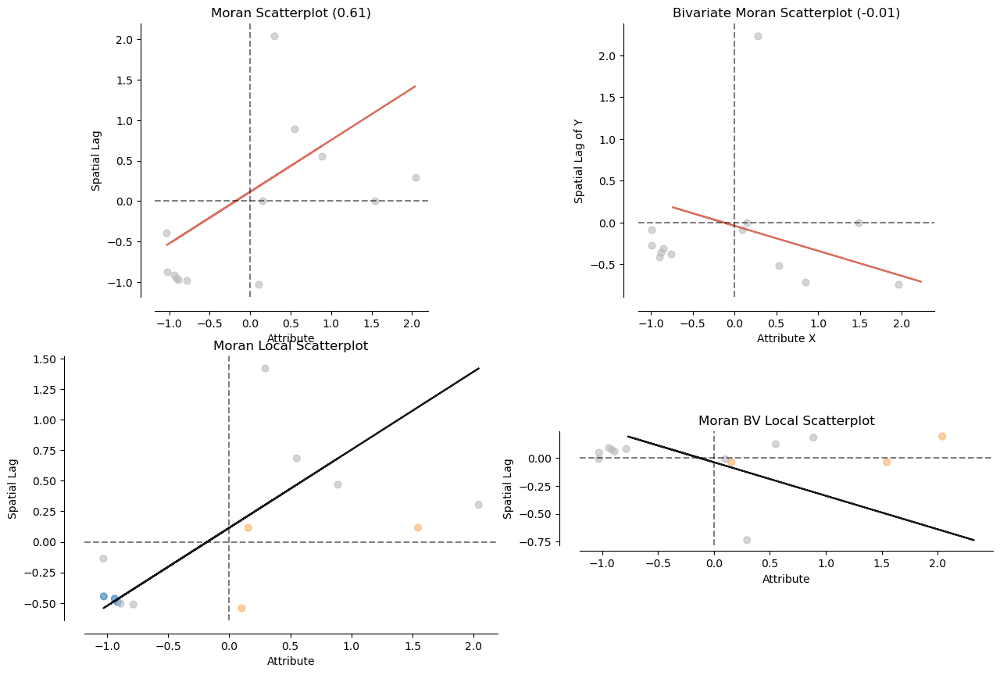

In [66]:
fig, axs = plt.subplots(2, 2, figsize=(15,10),
                        subplot_kw={'aspect': 'equal'})

moran_scatterplot(moran, ax=axs[0,0])
moran_scatterplot(moran_loc, p=0.05, ax=axs[1,0])
moran_scatterplot(moran_bv, ax=axs[0,1])
moran_scatterplot(moran_loc_bv, p=0.05, ax=axs[1,1])
plt.show()

Analizamos la autocorrelación espacial de la variable "Renta 2019" y su relación con la variable "Total cases 2019":

1. **Moran Scatterplot (Índice de Moran Univariante):**
   - Resultado: 0.61
   - Interpretación: Un valor de 0.61 indica una autocorrelación espacial positiva moderada. Esto sugiere que las áreas con valores altos de "Renta 2019" tienden a estar cerca de otras áreas con valores altos, y las áreas con valores bajos tienden a estar cerca de otras áreas con valores bajos. La autocorrelación positiva sugiere cierta tendencia espacial en la distribución de la variable "Renta 2019".

2. **Bivariante Moran Scatterplot (Índice de Moran Bivariante):**
   - Resultado: -0.01
   - Interpretación: Un valor cercano a cero en el índice de Moran bivariante indica que no hay una correlación espacial significativa entre "Renta 2019" y "Total cases 2019". Indica que, en términos generales, las áreas con altos niveles de "Renta 2019" no tienden a estar cerca de áreas con altos niveles de "Total cases 2019" y viceversa. La relación espacial entre estas dos variables no es evidente.

Ambos resultados se presentan en un scatterplot (gráfico de dispersión) que muestra cómo se distribuyen espacialmente los valores de las variables analizadas. Un índice de Moran positivo indica agrupamiento espacial (valores similares cerca entre sí), mientras que un índice cercano a cero sugiere una distribución espacial aleatoria o sin patrón discernible.

## Declaración de Autor (CRediT statement):

**Fossoul_Valerio_Marco:** Metodología, Software, Análisis, Visualización, Investigación, Validación, Validación.

**Díaz_Nieto_Marcos:** Conceptualización, Metodología, Búsqueda y preparación de los datos, Análisis, visualización, Redacción.